In [4]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json

import sys
sys.path.append('../')

import utils
from utils import ax_rocs, plot_rocs, rocs_models
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
LOCAL_PC = False
root_dir = "/mnt/w" if LOCAL_PC else "/data/bodyct"
EXPERIMENT_DIR = f"{root_dir}/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst-preds"

NLST_PREDS_LOCAL = "/mnt/c/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = NLST_PREDS_LOCAL ## Comment out if not using Teams backup (aka Chansey is up :)

In [5]:
nlst_preds = pd.read_csv(f'{NLST_PREDS}/nlst_demo_v1_w4preds.csv')
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Data columns (total 89 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   PatientID            16077 non-null  int64  
 1   StudyDate            16077 non-null  int64  
 2   SeriesInstanceUID    16077 non-null  object 
 3   CoordX               16077 non-null  float64
 4   CoordY               16077 non-null  float64
 5   CoordZ               16077 non-null  float64
 6   LesionID             16077 non-null  int64  
 7   NoduleType           16077 non-null  object 
 8   Spiculation          16077 non-null  bool   
 9   Diameter [mm]        16077 non-null  float64
 10  Age                  16077 non-null  int64  
 11  Gender               16077 non-null  int64  
 12  FamilyHistoryLungCa  16077 non-null  bool   
 13  Emphysema            16077 non-null  bool   
 14  NoduleInUpperLung    16077 non-null  bool   
 15  NoduleCounts         16077 non-null 

In [6]:
with open(f'{NLST_PREDS}/nlst_demo_v1_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [7]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    # "de Haas": "Thijmen_mean",
    "de Haas local": "Thijmen_local",
    # "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

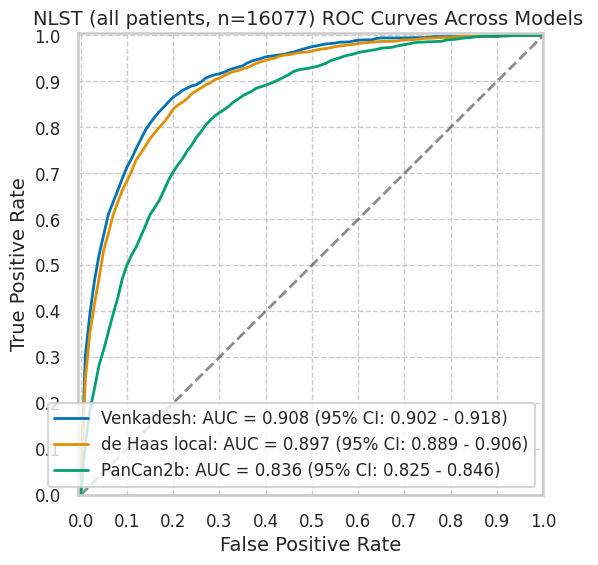

In [8]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [9]:
utils.stats_from_cm(*utils.cm_with_thres(nlst_preds))

{'num': 16077,
 'tp': 1175,
 'fp': 5327,
 'tn': 9501,
 'fn': 74,
 'tpr': 0.9407526020816653,
 'fpr': 0.3592527650391152,
 'fnr': 0.059247397918334666,
 'tnr': 0.6407472349608848,
 'ppv': 0.18071362657643802,
 'npv': 0.9922715404699739,
 'fdr': 0.819286373423562,
 'for': 0.00772845953002611,
 'acc': 0.6640542389749331}

## Plot results by category

In [10]:
def plot_by_category(df, cat, models=MODEL_TO_COL.keys()):
    groups = df.groupby(cat) 
    df_catinfo, plot_roc = utils.info_by_splits(groups)
    display(df_catinfo)

    if not plot_roc:
        print("Not plotting ROC since there are zero values for malignant or benign nodules :(")
        return df_catinfo

    rocs = {}
    for m in models:
        rocs[m], df_perf = utils.perf_by_splits(groups, pred_col=MODEL_TO_COL[m])
        print(m)
        display(df_perf)

    fig, ax = plt.subplots(1, len(models), figsize=(6.5*len(models) - 0.5, 6))
    fig.suptitle(f"Model Performance Split By {cat}")
    for i, m in enumerate(models):
        utils.ax_rocs(ax[i], rocs[m], title=m)
    plt.show()

    return df_catinfo        

### Included columns (from predictions)

NoduleInUpperLung


,num,pct,num_mal,pct_mal
False,9331,58.039435,483,5.176294
True,6746,41.960565,766,11.354877


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,9331,452,2601,6247,31,0.935818,0.293965,0.064182,0.706035,0.148051,0.995062,0.851949,0.004938,0.717929
True,6746,723,2726,3254,43,0.943864,0.455853,0.056136,0.544147,0.209626,0.986958,0.790374,0.013042,0.589535


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,9331,460,3088,5760,23,0.952381,0.349005,0.047619,0.650995,0.129651,0.996023,0.870349,0.003977,0.666595
True,6746,731,3256,2724,35,0.954308,0.544482,0.045692,0.455518,0.183346,0.987314,0.816654,0.012686,0.512155


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,9331,423,2937,5911,60,0.875776,0.331939,0.124224,0.668061,0.125893,0.989951,0.874107,0.010049,0.678813
True,6746,708,3443,2537,58,0.924282,0.575753,0.075718,0.424247,0.170561,0.977649,0.829439,0.022351,0.481026


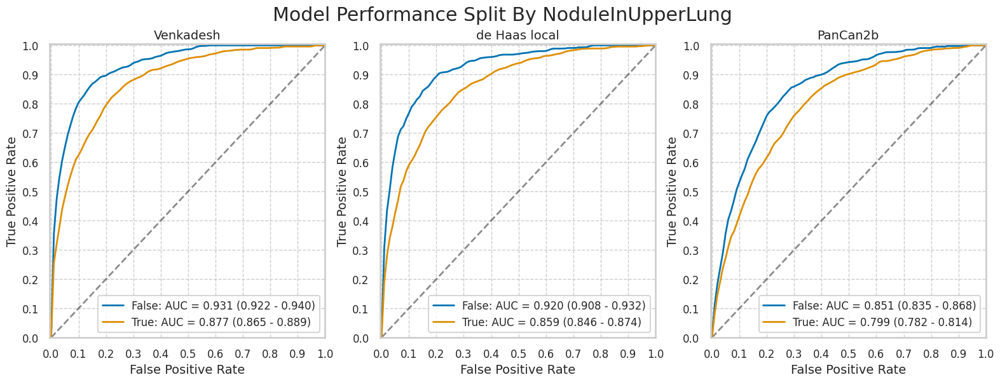

Spiculation


,num,pct,num_mal,pct_mal
False,16057,99.875599,1230,7.660211
True,20,0.124401,19,95.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,16057,1156,5327,9500,74,0.939837,0.359277,0.060163,0.640723,0.178313,0.992271,0.821687,0.007729,0.663636
True,20,19,0,1,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,16057,1172,6344,8483,58,0.952846,0.427868,0.047154,0.572132,0.155934,0.993209,0.844066,0.006791,0.601295
True,20,19,0,1,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,16057,1112,6380,8447,118,0.904065,0.430296,0.095935,0.569704,0.148425,0.986223,0.851575,0.013777,0.595317
True,20,19,0,1,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000


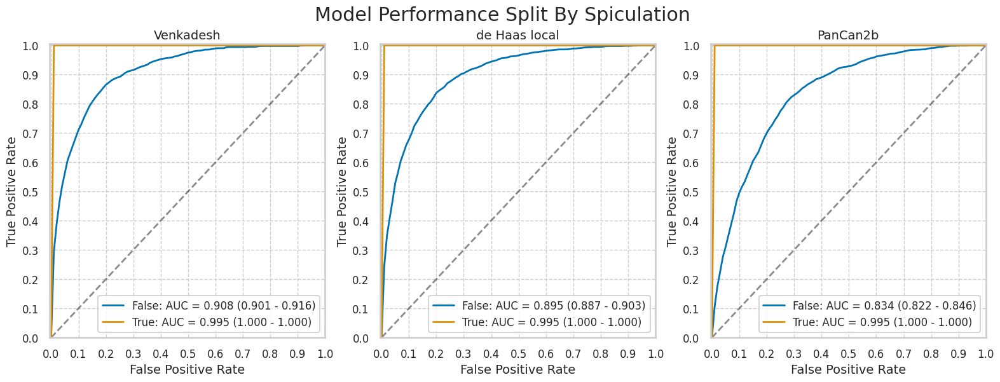

NoduleType


,num,pct,num_mal,pct_mal
Calcified,8,0.049761,0,0.000000
GroundGlassOpacity,3611,22.460658,0,0.000000
NonSolid,126,0.783728,126,100.000000
PartSolid,245,1.523916,245,100.000000
Perifissural,929,5.778441,0,0.000000
SemiSolid,1472,9.155937,0,0.000000
Solid,9686,60.247559,878,9.064629


Not plotting ROC since there are zero values for malignant or benign nodules :(


In [11]:
pred_only_cols = ["NoduleInUpperLung", "Spiculation", "NoduleType"]
for c in pred_only_cols:
    print(c)
    plot_by_category(nlst_preds, c)

### Demographics

marital


,num,pct,num_mal,pct_mal
1.0,644,4.016966,48,7.453416
2.0,10898,67.976547,796,7.304092
3.0,1327,8.277196,127,9.570460
4.0,206,1.284930,17,8.252427
5.0,2957,18.444361,259,8.758877


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,644,40,231,365,8,0.833333,0.387584,0.166667,0.612416,0.147601,0.978552,0.852399,0.021448,0.628882
2.0,10898,755,3542,6560,41,0.948492,0.350624,0.051508,0.649376,0.175704,0.993789,0.824296,0.006211,0.671224
3.0,1327,117,487,713,10,0.921260,0.405833,0.078740,0.594167,0.193709,0.986169,0.806291,0.013831,0.625471
4.0,206,15,66,123,2,0.882353,0.349206,0.117647,0.650794,0.185185,0.984000,0.814815,0.016000,0.669903
5.0,2957,246,977,1721,13,0.949807,0.362120,0.050193,0.637880,0.201145,0.992503,0.798855,0.007497,0.665201


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,644,48,257,339,0,1.000000,0.431208,0.000000,0.568792,0.157377,1.000000,0.842623,0.000000,0.600932
2.0,10898,756,4323,5779,40,0.949749,0.427935,0.050251,0.572065,0.148848,0.993126,0.851152,0.006874,0.599651
3.0,1327,121,534,666,6,0.952756,0.445000,0.047244,0.555000,0.184733,0.991071,0.815267,0.008929,0.593067
4.0,206,17,69,120,0,1.000000,0.365079,0.000000,0.634921,0.197674,1.000000,0.802326,0.000000,0.665049
5.0,2957,247,1138,1560,12,0.953668,0.421794,0.046332,0.578206,0.178339,0.992366,0.821661,0.007634,0.611092


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,644,45,288,308,3,0.937500,0.483221,0.062500,0.516779,0.135135,0.990354,0.864865,0.009646,0.548137
2.0,10898,719,4071,6031,77,0.903266,0.402990,0.096734,0.597010,0.150104,0.987394,0.849896,0.012606,0.619380
3.0,1327,114,644,556,13,0.897638,0.536667,0.102362,0.463333,0.150396,0.977153,0.849604,0.022847,0.504898
4.0,206,15,81,108,2,0.882353,0.428571,0.117647,0.571429,0.156250,0.981818,0.843750,0.018182,0.597087
5.0,2957,236,1275,1423,23,0.911197,0.472572,0.088803,0.527428,0.156188,0.984094,0.843812,0.015906,0.561042


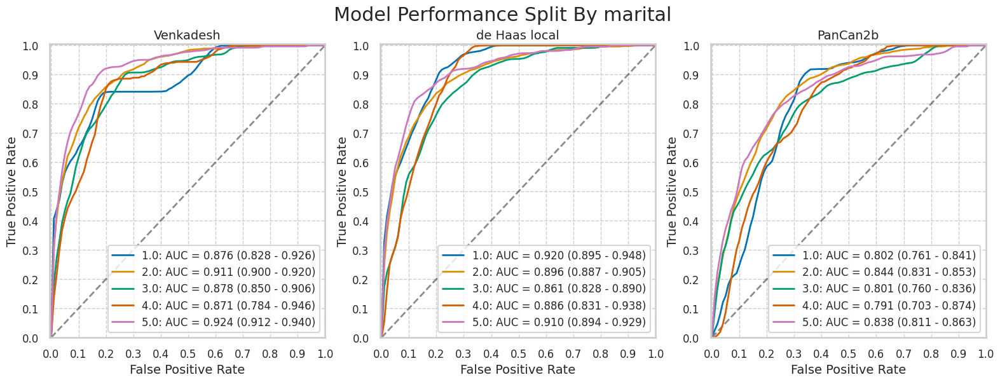

educat


,num,pct,num_mal,pct_mal
1.0,268,1.696739,24,8.955224
2.0,872,5.520734,74,8.486239
3.0,4077,25.811966,311,7.628158
4.0,2307,14.605888,176,7.628955
5.0,3539,22.405825,304,8.589997
6.0,2493,15.783476,187,7.501003
7.0,2239,14.175372,145,6.476105


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,268,21,113,131,3,0.875000,0.463115,0.125000,0.536885,0.156716,0.977612,0.843284,0.022388,0.567164
2.0,872,72,339,459,2,0.972973,0.424812,0.027027,0.575188,0.175182,0.995662,0.824818,0.004338,0.608945
3.0,4077,293,1369,2397,18,0.942122,0.363516,0.057878,0.636484,0.176294,0.992547,0.823706,0.007453,0.659799
4.0,2307,163,726,1405,13,0.926136,0.340685,0.073864,0.659315,0.183352,0.990832,0.816648,0.009168,0.679671
5.0,3539,293,1165,2070,11,0.963816,0.360124,0.036184,0.639876,0.200960,0.994714,0.799040,0.005286,0.667703
6.0,2493,177,768,1538,10,0.946524,0.333044,0.053476,0.666956,0.187302,0.993540,0.812698,0.006460,0.687926
7.0,2239,128,736,1358,17,0.882759,0.351480,0.117241,0.648520,0.148148,0.987636,0.851852,0.012364,0.663689


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,268,21,117,127,3,0.875000,0.479508,0.125000,0.520492,0.152174,0.976923,0.847826,0.023077,0.552239
2.0,872,72,381,417,2,0.972973,0.477444,0.027027,0.522556,0.158940,0.995227,0.841060,0.004773,0.560780
3.0,4077,297,1645,2121,14,0.954984,0.436803,0.045016,0.563197,0.152935,0.993443,0.847065,0.006557,0.593083
4.0,2307,171,848,1283,5,0.971591,0.397935,0.028409,0.602065,0.167812,0.996118,0.832188,0.003882,0.630256
5.0,3539,294,1371,1864,10,0.967105,0.423802,0.032895,0.576198,0.176577,0.994664,0.823423,0.005336,0.609777
6.0,2493,172,968,1338,15,0.919786,0.419775,0.080214,0.580225,0.150877,0.988914,0.849123,0.011086,0.605696
7.0,2239,136,879,1215,9,0.937931,0.419771,0.062069,0.580229,0.133990,0.992647,0.866010,0.007353,0.603394


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,268,24,118,126,0,1.000000,0.483607,0.000000,0.516393,0.169014,1.000000,0.830986,0.000000,0.559701
2.0,872,66,382,416,8,0.891892,0.478697,0.108108,0.521303,0.147321,0.981132,0.852679,0.018868,0.552752
3.0,4077,288,1665,2101,23,0.926045,0.442114,0.073955,0.557886,0.147465,0.989171,0.852535,0.010829,0.585970
4.0,2307,160,921,1210,16,0.909091,0.432191,0.090909,0.567809,0.148011,0.986949,0.851989,0.013051,0.593845
5.0,3539,272,1345,1890,32,0.894737,0.415765,0.105263,0.584235,0.168213,0.983351,0.831787,0.016649,0.610907
6.0,2493,166,960,1346,21,0.887701,0.416305,0.112299,0.583695,0.147425,0.984638,0.852575,0.015362,0.606498
7.0,2239,130,868,1226,15,0.896552,0.414518,0.103448,0.585482,0.130261,0.987913,0.869739,0.012087,0.605628


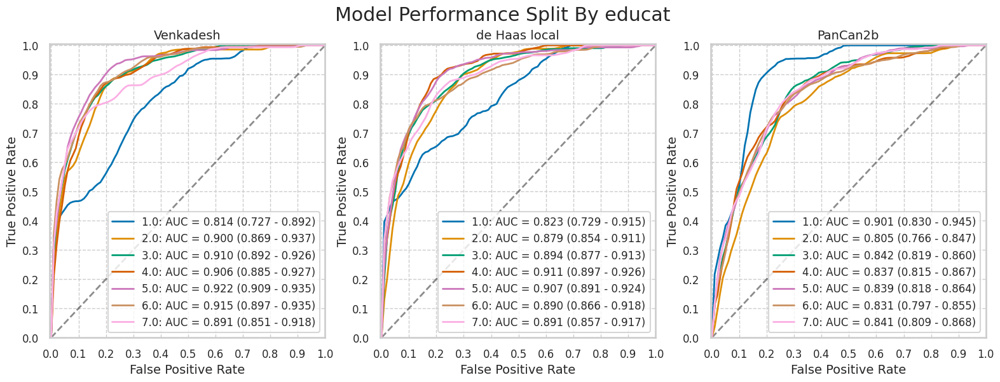

race


,num,pct,num_mal,pct_mal
1.0,15040,93.777279,1145,7.613032
2.0,481,2.999127,57,11.850312
3.0,228,1.421624,21,9.210526
4.0,68,0.423993,12,17.647059
5.0,44,0.274348,2,4.545455
6.0,177,1.103629,10,5.649718


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,15040,1076,4968,8927,69,0.939738,0.357539,0.060262,0.642461,0.178028,0.992330,0.821972,0.007670,0.665093
2.0,481,53,160,264,4,0.929825,0.377358,0.070175,0.622642,0.248826,0.985075,0.751174,0.014925,0.659044
3.0,228,21,77,130,0,1.000000,0.371981,0.000000,0.628019,0.214286,1.000000,0.785714,0.000000,0.662281
4.0,68,11,19,37,1,0.916667,0.339286,0.083333,0.660714,0.366667,0.973684,0.633333,0.026316,0.705882
5.0,44,2,15,27,0,1.000000,0.357143,0.000000,0.642857,0.117647,1.000000,0.882353,0.000000,0.659091
6.0,177,10,70,97,0,1.000000,0.419162,0.000000,0.580838,0.125000,1.000000,0.875000,0.000000,0.604520


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,15040,1090,5914,7981,55,0.951965,0.425621,0.048035,0.574379,0.155625,0.993156,0.844375,0.006844,0.603125
2.0,481,54,198,226,3,0.947368,0.466981,0.052632,0.533019,0.214286,0.986900,0.785714,0.013100,0.582121
3.0,228,21,87,120,0,1.000000,0.420290,0.000000,0.579710,0.194444,1.000000,0.805556,0.000000,0.618421
4.0,68,12,32,24,0,1.000000,0.571429,0.000000,0.428571,0.272727,1.000000,0.727273,0.000000,0.529412
5.0,44,2,20,22,0,1.000000,0.476190,0.000000,0.523810,0.090909,1.000000,0.909091,0.000000,0.545455
6.0,177,10,70,97,0,1.000000,0.419162,0.000000,0.580838,0.125000,1.000000,0.875000,0.000000,0.604520


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,15040,1039,5950,7945,106,0.907424,0.428212,0.092576,0.571788,0.148662,0.986834,0.851338,0.013166,0.597340
2.0,481,51,217,207,6,0.894737,0.511792,0.105263,0.488208,0.190299,0.971831,0.809701,0.028169,0.536383
3.0,228,17,82,125,4,0.809524,0.396135,0.190476,0.603865,0.171717,0.968992,0.828283,0.031008,0.622807
4.0,68,10,26,30,2,0.833333,0.464286,0.166667,0.535714,0.277778,0.937500,0.722222,0.062500,0.588235
5.0,44,2,16,26,0,1.000000,0.380952,0.000000,0.619048,0.111111,1.000000,0.888889,0.000000,0.636364
6.0,177,10,65,102,0,1.000000,0.389222,0.000000,0.610778,0.133333,1.000000,0.866667,0.000000,0.632768


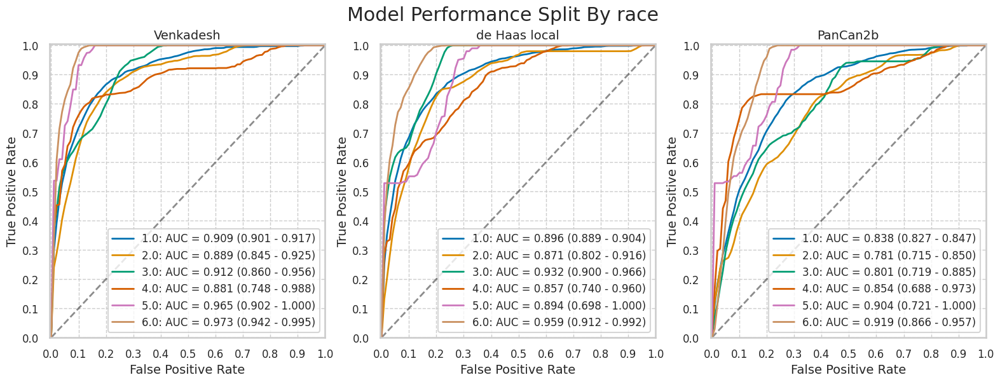

ethnic


,num,pct,num_mal,pct_mal
1.0,210,1.313403,9,4.285714
2.0,15779,98.686597,1230,7.795171


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,210,9,78,123,0,1.000000,0.388060,0.000000,0.611940,0.103448,1.000000,0.896552,0.000000,0.628571
2.0,15779,1156,5217,9332,74,0.939837,0.358581,0.060163,0.641419,0.181390,0.992133,0.818610,0.007867,0.664681


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,210,9,96,105,0,1.000000,0.477612,0.000000,0.522388,0.085714,1.000000,0.914286,0.000000,0.542857
2.0,15779,1172,6216,8333,58,0.952846,0.427246,0.047154,0.572754,0.158636,0.993088,0.841364,0.006912,0.602383


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1.0,210,9,94,107,0,1.000000,0.467662,0.000000,0.532338,0.087379,1.000000,0.912621,0.000000,0.552381
2.0,15779,1112,6257,8292,118,0.904065,0.430064,0.095935,0.569936,0.150902,0.985969,0.849098,0.014031,0.595982


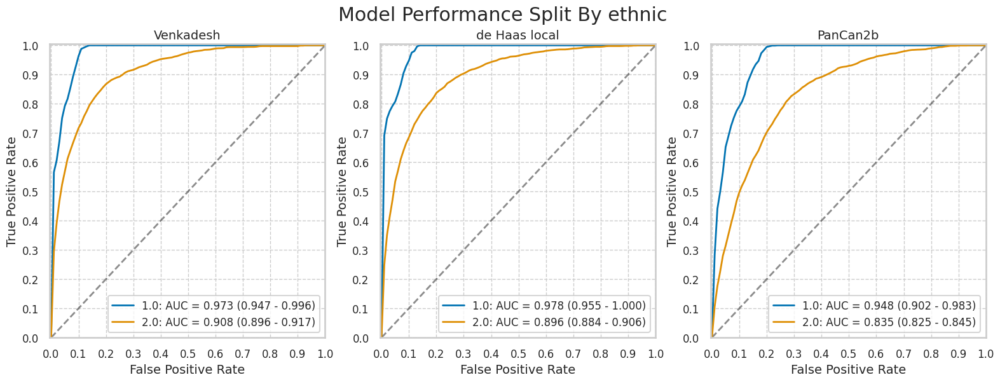

Gender


,num,pct,num_mal,pct_mal
1,9281,57.728432,727,7.833208
2,6796,42.271568,522,7.680989


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,9281,697,3051,5503,30,0.958735,0.356675,0.041265,0.643325,0.185966,0.994578,0.814034,0.005422,0.668031
2,6796,478,2276,3998,44,0.915709,0.362767,0.084291,0.637233,0.173566,0.989114,0.826434,0.010886,0.658623


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,9281,692,3640,4914,35,0.951857,0.425532,0.048143,0.574468,0.159741,0.992928,0.840259,0.007072,0.604030
2,6796,499,2704,3570,23,0.955939,0.430985,0.044061,0.569015,0.155791,0.993599,0.844209,0.006401,0.598735


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
1,9281,649,3158,5396,78,0.892710,0.369184,0.107290,0.630816,0.170475,0.985751,0.829525,0.014249,0.651331
2,6796,482,3222,3052,40,0.923372,0.513548,0.076628,0.486452,0.130130,0.987063,0.869870,0.012937,0.520012


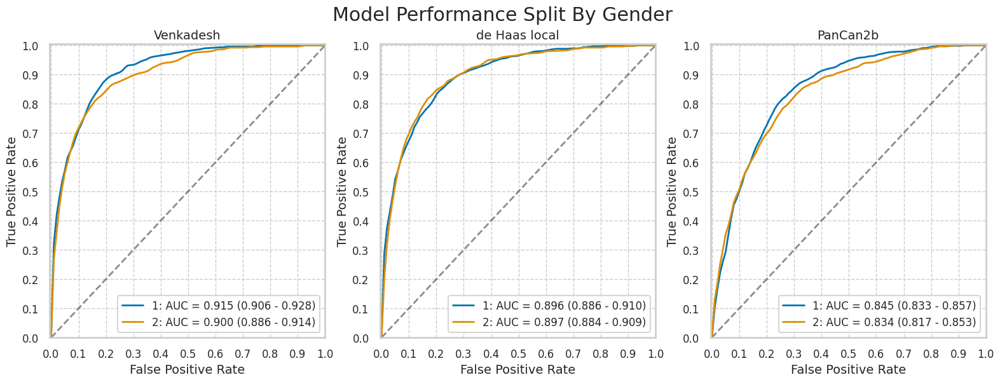

In [12]:
for cat in nlst_democols['cat']['demo']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Smoking

cigar


,num,pct,num_mal,pct_mal
0.0,13031,81.306545,1005,7.712378
1.0,2996,18.693455,240,8.010681


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,13031,942,4333,7693,63,0.937313,0.360303,0.062687,0.639697,0.178578,0.991877,0.821422,0.008123,0.662651
1.0,2996,229,971,1785,11,0.954167,0.352322,0.045833,0.647678,0.190833,0.993875,0.809167,0.006125,0.672230


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,13031,961,5140,6886,44,0.956219,0.427407,0.043781,0.572593,0.157515,0.993651,0.842485,0.006349,0.602179
1.0,2996,226,1182,1574,14,0.941667,0.428882,0.058333,0.571118,0.160511,0.991184,0.839489,0.008816,0.600801


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,13031,907,5310,6716,98,0.902488,0.441543,0.097512,0.558457,0.145890,0.985618,0.854110,0.014382,0.584990
1.0,2996,220,1048,1708,20,0.916667,0.380261,0.083333,0.619739,0.173502,0.988426,0.826498,0.011574,0.643525


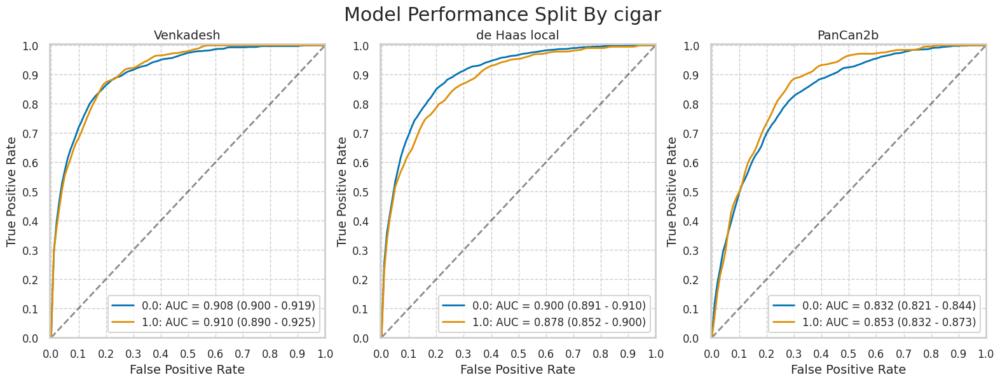

cigsmok


,num,pct,num_mal,pct_mal
0,7911,49.206942,575,7.268361
1,8166,50.793058,674,8.253735


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,7911,550,2651,4685,25,0.956522,0.361369,0.043478,0.638631,0.171821,0.994692,0.828179,0.005308,0.661737
1,8166,625,2676,4816,49,0.927300,0.357181,0.072700,0.642819,0.189337,0.989928,0.810663,0.010072,0.666299


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,7911,546,3103,4233,29,0.949565,0.422983,0.050435,0.577017,0.14963,0.993196,0.85037,0.006804,0.604096
1,8166,645,3241,4251,29,0.956973,0.432595,0.043027,0.567405,0.16598,0.993224,0.83402,0.006776,0.599559


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0,7911,532,3176,4160,43,0.925217,0.432933,0.074783,0.567067,0.143474,0.989769,0.856526,0.010231,0.593098
1,8166,599,3204,4288,75,0.888724,0.427656,0.111276,0.572344,0.157507,0.982810,0.842493,0.017190,0.598457


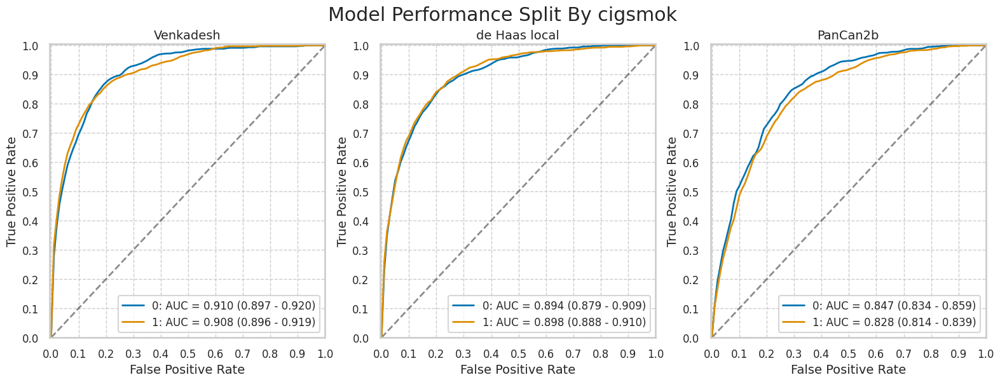

pipe


,num,pct,num_mal,pct_mal
0.0,12542,78.485607,948,7.558603
1.0,3438,21.514393,297,8.638743


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,12542,887,4157,7437,61,0.935654,0.358548,0.064346,0.641452,0.175852,0.991864,0.824148,0.008136,0.663690
1.0,3438,284,1130,2011,13,0.956229,0.359758,0.043771,0.640242,0.200849,0.993577,0.799151,0.006423,0.667539


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,12542,904,4940,6654,44,0.953586,0.426082,0.046414,0.573918,0.154689,0.993431,0.845311,0.006569,0.602615
1.0,3438,283,1354,1787,14,0.952862,0.431073,0.047138,0.568927,0.172877,0.992227,0.827123,0.007773,0.602094


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,12542,866,5130,6464,82,0.913502,0.442470,0.086498,0.557530,0.144430,0.987473,0.855570,0.012527,0.584436
1.0,3438,261,1203,1938,36,0.878788,0.382999,0.121212,0.617001,0.178279,0.981763,0.821721,0.018237,0.639616


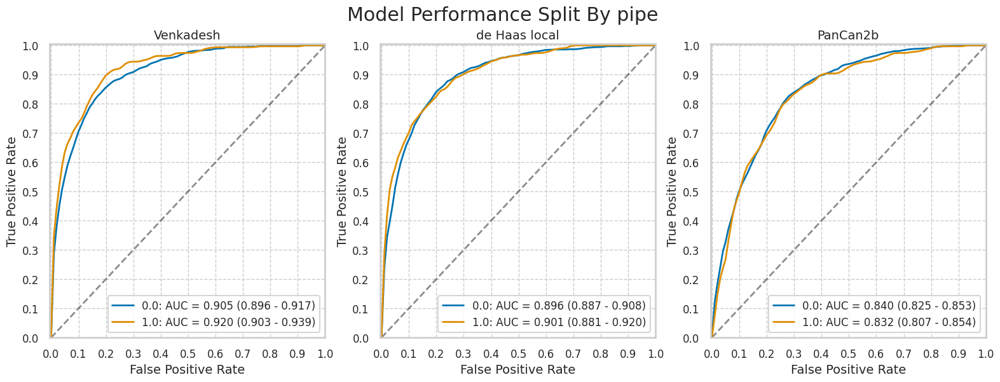

smokelive


,num,pct,num_mal,pct_mal
0.0,1870,11.678741,133,7.112299
1.0,14142,88.321259,1110,7.848961


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1870,127,642,1095,6,0.954887,0.369603,0.045113,0.630397,0.165150,0.994550,0.834850,0.005450,0.653476
1.0,14142,1043,4662,8370,67,0.939640,0.357735,0.060360,0.642265,0.182822,0.992059,0.817178,0.007941,0.665606


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1870,127,794,943,6,0.954887,0.45711,0.045113,0.54289,0.137894,0.993678,0.862106,0.006322,0.572193
1.0,14142,1059,5533,7499,51,0.954054,0.42457,0.045946,0.57543,0.160649,0.993245,0.839351,0.006755,0.605148


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,1870,122,723,1014,11,0.917293,0.416235,0.082707,0.583765,0.144379,0.989268,0.855621,0.010732,0.607487
1.0,14142,1003,5638,7394,107,0.903604,0.432627,0.096396,0.567373,0.151031,0.985735,0.848969,0.014265,0.593763


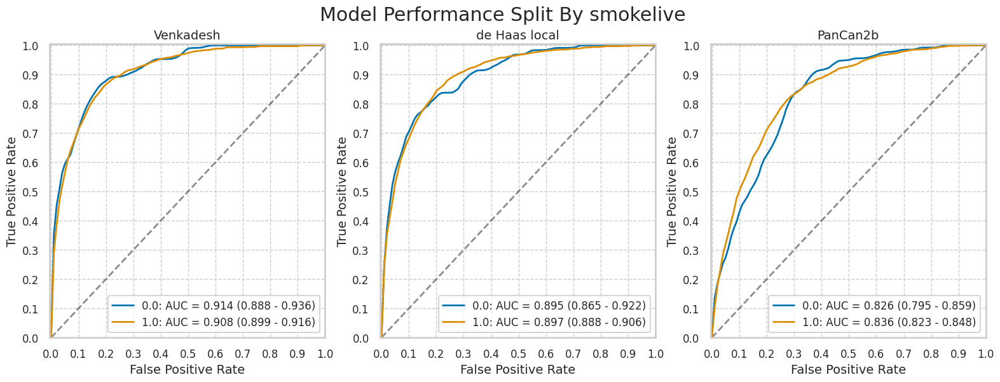

smokework


,num,pct,num_mal,pct_mal
0.0,2041,12.784215,142,6.957374
1.0,13924,87.215785,1095,7.864120


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2041,129,734,1165,13,0.908451,0.386519,0.091549,0.613481,0.149479,0.988964,0.850521,0.011036,0.634003
1.0,13924,1035,4550,8279,60,0.945205,0.354665,0.054795,0.645335,0.185318,0.992805,0.814682,0.007195,0.668917


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2041,132,820,1079,10,0.929577,0.431806,0.070423,0.568194,0.138655,0.990817,0.861345,0.009183,0.593337
1.0,13924,1048,5478,7351,47,0.957078,0.427001,0.042922,0.572999,0.160588,0.993647,0.839412,0.006353,0.603203


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,2041,124,844,1055,18,0.873239,0.444444,0.126761,0.555556,0.128099,0.983225,0.871901,0.016775,0.577658
1.0,13924,996,5491,7338,99,0.909589,0.428015,0.090411,0.571985,0.153538,0.986688,0.846462,0.013312,0.598535


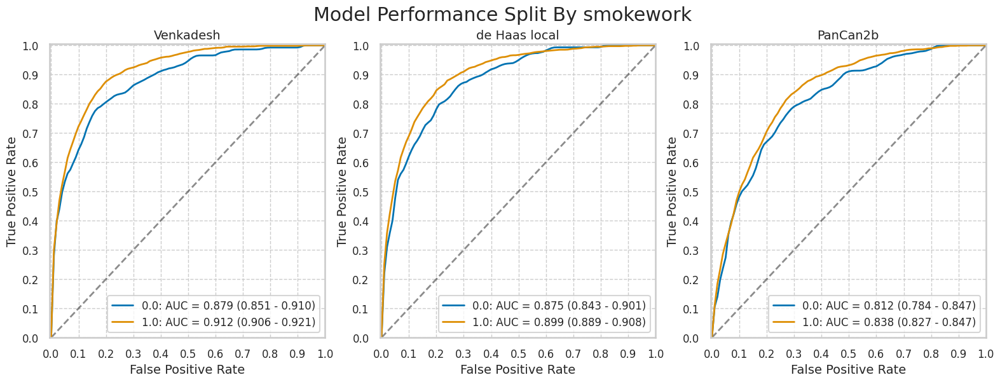

In [13]:
for cat in nlst_democols['cat']['smoke']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Work history

wrkasbe


,num,pct,num_mal,pct_mal
0.0,15277,95.089008,1182,7.737121
1.0,789,4.910992,66,8.365019


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15277,1109,5038,9057,73,0.938240,0.357432,0.061760,0.642568,0.180413,0.992004,0.819587,0.007996,0.665445
1.0,789,65,288,435,1,0.984848,0.398340,0.015152,0.601660,0.184136,0.997706,0.815864,0.002294,0.633714


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15277,1128,6020,8075,54,0.954315,0.427102,0.045685,0.572898,0.157806,0.993357,0.842194,0.006643,0.602409
1.0,789,62,322,401,4,0.939394,0.445367,0.060606,0.554633,0.161458,0.990123,0.838542,0.009877,0.586819


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15277,1068,6052,8043,114,0.903553,0.429372,0.096447,0.570628,0.150000,0.986024,0.850000,0.013976,0.596387
1.0,789,62,326,397,4,0.939394,0.450899,0.060606,0.549101,0.159794,0.990025,0.840206,0.009975,0.581749


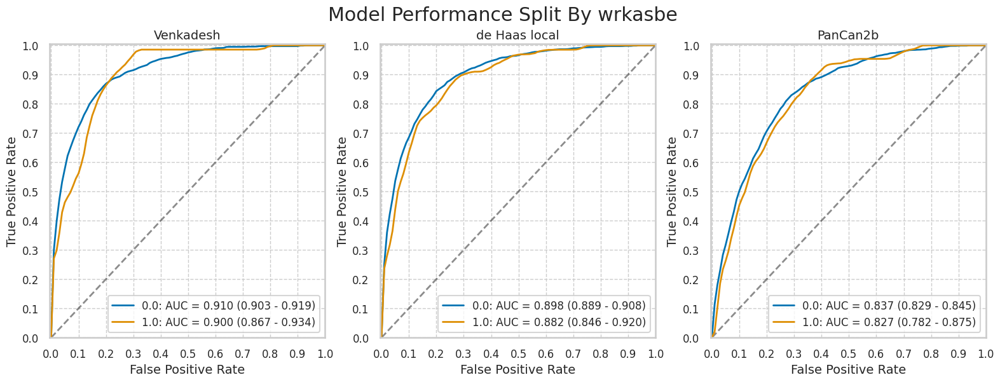

wrkbaki


,num,pct,num_mal,pct_mal
0.0,15644,97.312764,1221,7.804909
1.0,432,2.687236,27,6.250000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15644,1150,5191,9232,71,0.941851,0.359911,0.058149,0.640089,0.181359,0.992368,0.818641,0.007632,0.663641
1.0,432,24,136,269,3,0.888889,0.335802,0.111111,0.664198,0.150000,0.988971,0.850000,0.011029,0.678241


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15644,1166,6168,8255,55,0.954955,0.427650,0.045045,0.572350,0.158986,0.993381,0.841014,0.006619,0.602212
1.0,432,24,176,229,3,0.888889,0.434568,0.111111,0.565432,0.120000,0.987069,0.880000,0.012931,0.585648


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15644,1106,6212,8211,115,0.905815,0.430701,0.094185,0.569299,0.151134,0.986188,0.848866,0.013812,0.595564
1.0,432,24,168,237,3,0.888889,0.414815,0.111111,0.585185,0.125000,0.987500,0.875000,0.012500,0.604167


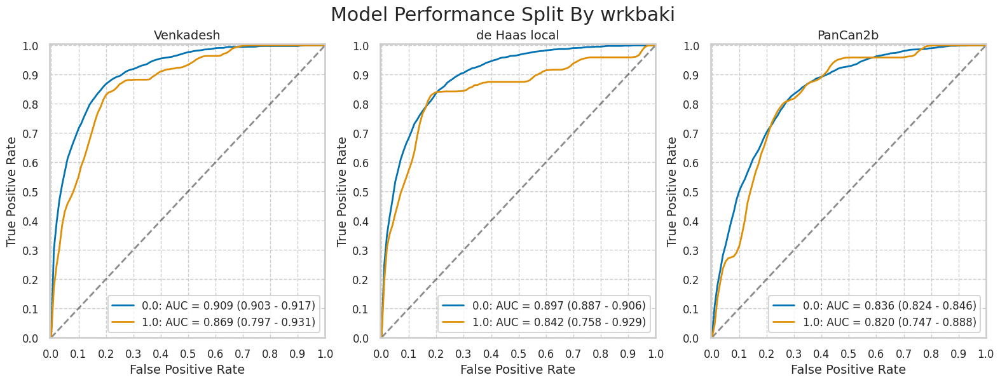

wrkbutc


,num,pct,num_mal,pct_mal
0.0,15780,98.158746,1223,7.750317
1.0,296,1.841254,25,8.445946


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15780,1151,5227,9330,72,0.941128,0.359071,0.058872,0.640929,0.180464,0.992342,0.819536,0.007658,0.664195
1.0,296,23,100,171,2,0.920000,0.369004,0.080000,0.630996,0.186992,0.988439,0.813008,0.011561,0.655405


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15780,1167,6223,8334,56,0.954211,0.427492,0.045789,0.572508,0.157916,0.993325,0.842084,0.006675,0.602091
1.0,296,23,121,150,2,0.920000,0.446494,0.080000,0.553506,0.159722,0.986842,0.840278,0.013158,0.584459


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15780,1106,6240,8317,117,0.904334,0.428660,0.095666,0.571340,0.150558,0.986128,0.849442,0.013872,0.597148
1.0,296,24,140,131,1,0.960000,0.516605,0.040000,0.483395,0.146341,0.992424,0.853659,0.007576,0.523649


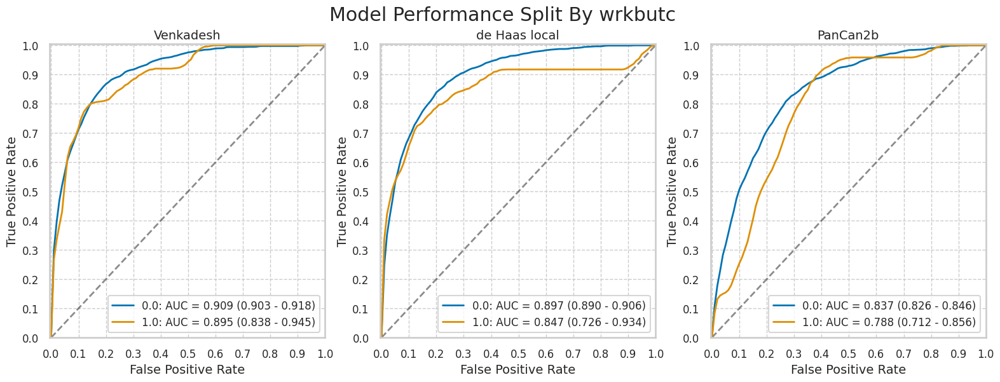

wrkchem


,num,pct,num_mal,pct_mal
0.0,15000,93.382307,1171,7.806667
1.0,1063,6.617693,77,7.243650


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15000,1100,4950,8879,71,0.939368,0.357943,0.060632,0.642057,0.181818,0.992067,0.818182,0.007933,0.665267
1.0,1063,74,376,610,3,0.961039,0.381339,0.038961,0.618661,0.164444,0.995106,0.835556,0.004894,0.643462


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15000,1114,5871,7958,57,0.951324,0.424543,0.048676,0.575457,0.159485,0.992888,0.840515,0.007112,0.604800
1.0,1063,76,472,514,1,0.987013,0.478702,0.012987,0.521298,0.138686,0.998058,0.861314,0.001942,0.555033


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15000,1061,5922,7907,110,0.906063,0.428231,0.093937,0.571769,0.151940,0.986279,0.848060,0.013721,0.597867
1.0,1063,69,454,532,8,0.896104,0.460446,0.103896,0.539554,0.131931,0.985185,0.868069,0.014815,0.565381


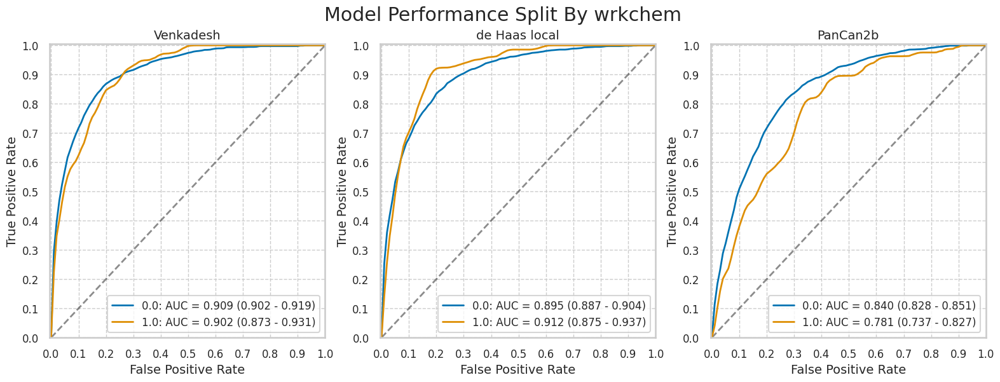

wrkcoal


,num,pct,num_mal,pct_mal
0.0,15994,99.489923,1241,7.759160
1.0,82,0.510077,7,8.536585


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15994,1167,5288,9465,74,0.940371,0.358436,0.059629,0.641564,0.180790,0.992242,0.819210,0.007758,0.664749
1.0,82,7,39,36,0,1.000000,0.520000,0.000000,0.480000,0.152174,1.000000,0.847826,0.000000,0.524390


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15994,1183,6295,8458,58,0.953263,0.426693,0.046737,0.573307,0.158197,0.993189,0.841803,0.006811,0.602789
1.0,82,7,49,26,0,1.000000,0.653333,0.000000,0.346667,0.125000,1.000000,0.875000,0.000000,0.402439


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15994,1123,6346,8407,118,0.904915,0.430150,0.095085,0.569850,0.150355,0.986158,0.849645,0.013842,0.595848
1.0,82,7,34,41,0,1.000000,0.453333,0.000000,0.546667,0.170732,1.000000,0.829268,0.000000,0.585366


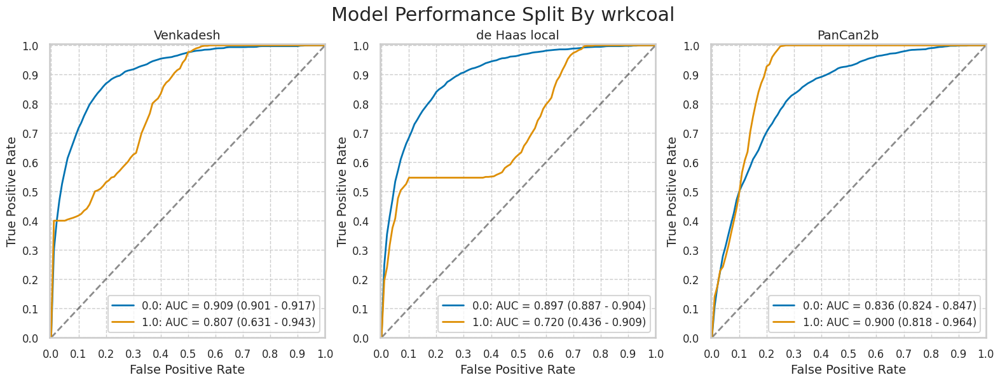

wrkcott


,num,pct,num_mal,pct_mal
0.0,15950,99.216223,1232,7.724138
1.0,126,0.783777,16,12.698413


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15950,1158,5285,9433,74,0.939935,0.359084,0.060065,0.640916,0.179730,0.992216,0.820270,0.007784,0.664013
1.0,126,16,42,68,0,1.000000,0.381818,0.000000,0.618182,0.275862,1.000000,0.724138,0.000000,0.666667


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15950,1174,6289,8429,58,0.952922,0.4273,0.047078,0.5727,0.157309,0.993166,0.842691,0.006834,0.602069
1.0,126,16,55,55,0,1.000000,0.5000,0.000000,0.5000,0.225352,1.000000,0.774648,0.000000,0.563492


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15950,1115,6322,8396,117,0.905032,0.429542,0.094968,0.570458,0.149926,0.986256,0.850074,0.013744,0.596301
1.0,126,15,58,52,1,0.937500,0.527273,0.062500,0.472727,0.205479,0.981132,0.794521,0.018868,0.531746


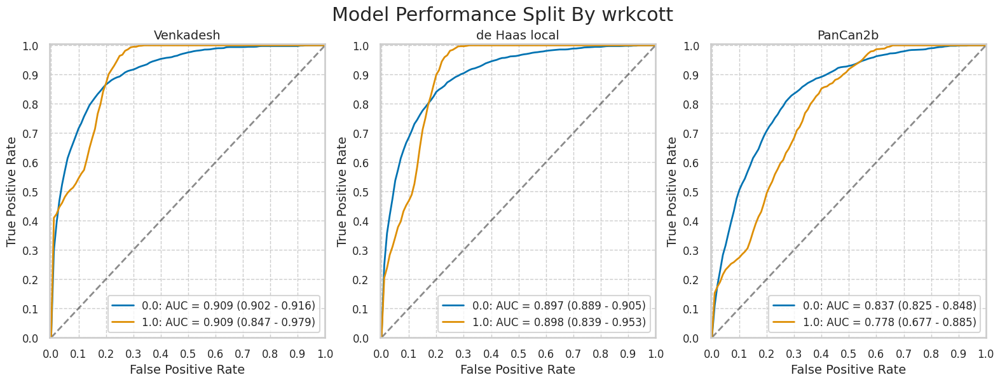

wrkfarm


,num,pct,num_mal,pct_mal
0.0,14253,88.676663,1124,7.886059
1.0,1820,11.323337,121,6.648352


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14253,1056,4663,8466,68,0.939502,0.355168,0.060498,0.644832,0.184648,0.992032,0.815352,0.007968,0.668070
1.0,1820,115,664,1035,6,0.950413,0.390818,0.049587,0.609182,0.147625,0.994236,0.852375,0.005764,0.631868


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14253,1072,5553,7576,52,0.953737,0.422957,0.046263,0.577043,0.161811,0.993183,0.838189,0.006817,0.606749
1.0,1820,115,791,908,6,0.950413,0.465568,0.049587,0.534432,0.126932,0.993435,0.873068,0.006565,0.562088


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14253,1017,5654,7475,107,0.904804,0.43065,0.095196,0.56935,0.152451,0.985888,0.847549,0.014112,0.595804
1.0,1820,110,726,973,11,0.909091,0.42731,0.090909,0.57269,0.131579,0.988821,0.868421,0.011179,0.595055


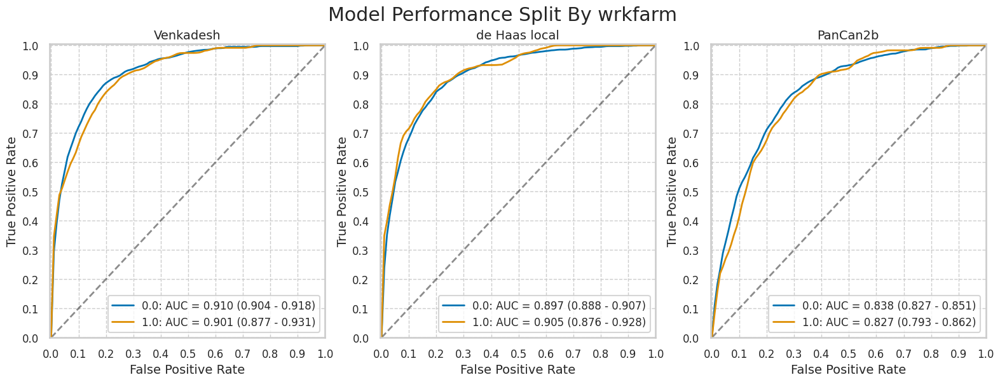

wrkfire


,num,pct,num_mal,pct_mal
0.0,15808,98.332919,1219,7.711285
1.0,268,1.667081,29,10.820896


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15808,1145,5243,9346,74,0.939295,0.359380,0.060705,0.640620,0.179242,0.992144,0.820758,0.007856,0.663651
1.0,268,29,84,155,0,1.000000,0.351464,0.000000,0.648536,0.256637,1.000000,0.743363,0.000000,0.686567


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15808,1161,6247,8342,58,0.95242,0.428199,0.04758,0.571801,0.156722,0.993095,0.843278,0.006905,0.601151
1.0,268,29,97,142,0,1.00000,0.405858,0.00000,0.594142,0.230159,1.000000,0.769841,0.000000,0.638060


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15808,1104,6300,8289,115,0.905660,0.431832,0.094340,0.568168,0.149109,0.986316,0.850891,0.013684,0.594193
1.0,268,26,80,159,3,0.896552,0.334728,0.103448,0.665272,0.245283,0.981481,0.754717,0.018519,0.690299


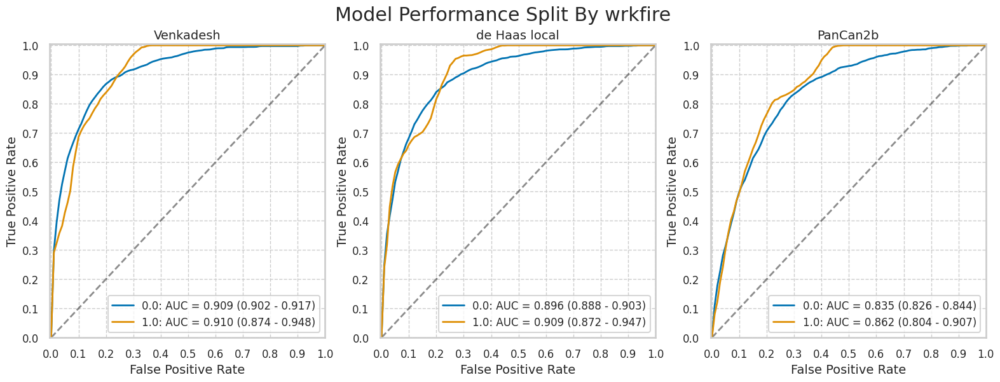

wrkflou


,num,pct,num_mal,pct_mal
0.0,15926,99.066932,1230,7.72322
1.0,150,0.933068,18,12.00000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15926,1156,5276,9420,74,0.939837,0.359009,0.060163,0.640991,0.179726,0.992206,0.820274,0.007794,0.664071
1.0,150,18,51,81,0,1.000000,0.386364,0.000000,0.613636,0.260870,1.000000,0.739130,0.000000,0.660000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15926,1176,6290,8406,54,0.956098,0.428008,0.043902,0.571992,0.157514,0.993617,0.842486,0.006383,0.601658
1.0,150,14,54,78,4,0.777778,0.409091,0.222222,0.590909,0.205882,0.951220,0.794118,0.048780,0.613333


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15926,1113,6317,8379,117,0.904878,0.429845,0.095122,0.570155,0.149798,0.986229,0.850202,0.013771,0.596007
1.0,150,17,63,69,1,0.944444,0.477273,0.055556,0.522727,0.212500,0.985714,0.787500,0.014286,0.573333


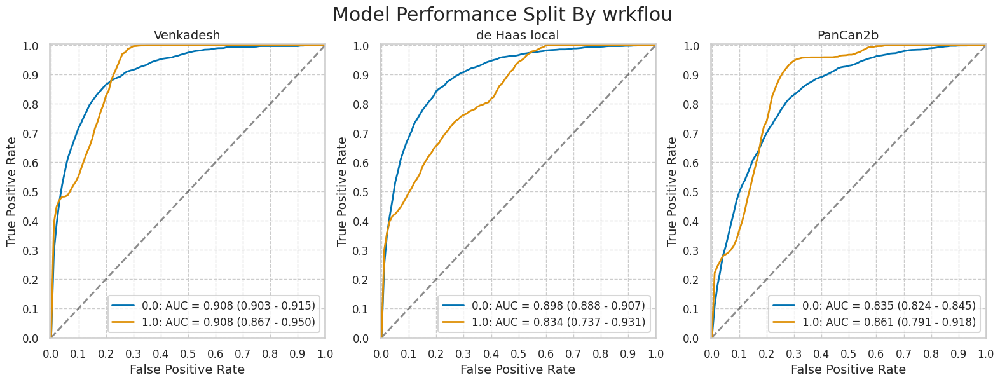

wrkfoun


,num,pct,num_mal,pct_mal
0.0,15409,95.850958,1182,7.670842
1.0,667,4.149042,66,9.895052


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15409,1114,5121,9106,68,0.942470,0.359949,0.057530,0.640051,0.178669,0.992588,0.821331,0.007412,0.663249
1.0,667,60,206,395,6,0.909091,0.342762,0.090909,0.657238,0.225564,0.985037,0.774436,0.014963,0.682159


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15409,1128,6080,8147,54,0.954315,0.427356,0.045685,0.572644,0.156493,0.993415,0.843507,0.006585,0.601921
1.0,667,62,264,337,4,0.939394,0.439268,0.060606,0.560732,0.190184,0.988270,0.809816,0.011730,0.598201


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15409,1073,6148,8079,109,0.907783,0.432136,0.092217,0.567864,0.148594,0.986688,0.851406,0.013312,0.593939
1.0,667,57,232,369,9,0.863636,0.386023,0.136364,0.613977,0.197232,0.976190,0.802768,0.023810,0.638681


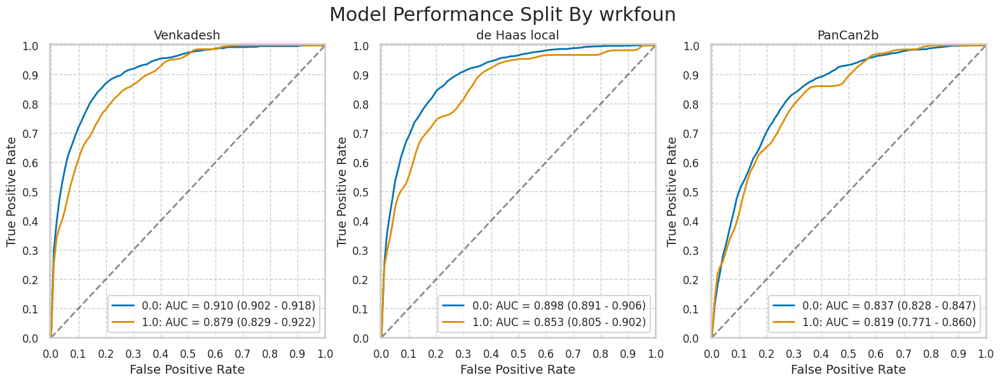

wrkhard


,num,pct,num_mal,pct_mal
0.0,15957,99.259766,1245,7.802218
1.0,119,0.740234,3,2.521008


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15957,1171,5269,9443,74,0.940562,0.358143,0.059438,0.641857,0.181832,0.992224,0.818168,0.007776,0.665163
1.0,119,3,58,58,0,1.000000,0.500000,0.000000,0.500000,0.049180,1.000000,0.950820,0.000000,0.512605


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15957,1187,6292,8420,58,0.953414,0.427678,0.046586,0.572322,0.158711,0.993159,0.841289,0.006841,0.602056
1.0,119,3,52,64,0,1.000000,0.448276,0.000000,0.551724,0.054545,1.000000,0.945455,0.000000,0.563025


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15957,1127,6333,8379,118,0.905221,0.430465,0.094779,0.569535,0.151072,0.986113,0.848928,0.013887,0.595726
1.0,119,3,47,69,0,1.000000,0.405172,0.000000,0.594828,0.060000,1.000000,0.940000,0.000000,0.605042


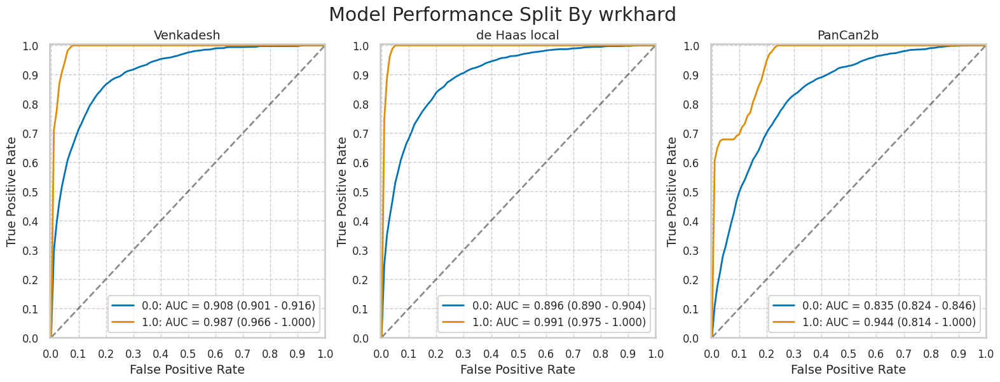

wrkpain


,num,pct,num_mal,pct_mal
0.0,15262,94.936551,1171,7.672651
1.0,814,5.063449,77,9.459459


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15262,1102,4997,9094,69,0.941076,0.354624,0.058924,0.645376,0.180685,0.992470,0.819315,0.007530,0.668064
1.0,814,72,330,407,5,0.935065,0.447761,0.064935,0.552239,0.179104,0.987864,0.820896,0.012136,0.588452


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15262,1116,6004,8087,55,0.953032,0.426088,0.046968,0.573912,0.156742,0.993245,0.843258,0.006755,0.603001
1.0,814,74,340,397,3,0.961039,0.461330,0.038961,0.538670,0.178744,0.992500,0.821256,0.007500,0.578624


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15262,1059,6044,8047,112,0.904355,0.428926,0.095645,0.571074,0.149092,0.986273,0.850908,0.013727,0.596645
1.0,814,71,336,401,6,0.922078,0.455902,0.077922,0.544098,0.174447,0.985258,0.825553,0.014742,0.579853


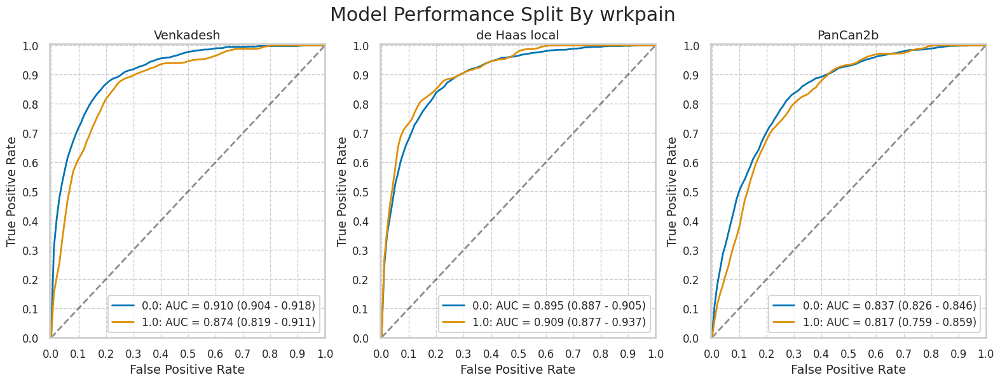

wrksand


,num,pct,num_mal,pct_mal
0.0,15834,98.49465,1213,7.66073
1.0,242,1.50535,35,14.46281


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15834,1145,5236,9385,68,0.943941,0.358115,0.056059,0.641885,0.179439,0.992807,0.820561,0.007193,0.665025
1.0,242,29,91,116,6,0.828571,0.439614,0.171429,0.560386,0.241667,0.950820,0.758333,0.049180,0.599174


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15834,1158,6242,8379,55,0.954658,0.426920,0.045342,0.573080,0.156486,0.993479,0.843514,0.006521,0.602311
1.0,242,32,102,105,3,0.914286,0.492754,0.085714,0.507246,0.238806,0.972222,0.761194,0.027778,0.566116


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15834,1100,6276,8345,113,0.906843,0.429246,0.093157,0.570754,0.149132,0.986640,0.850868,0.013360,0.596501
1.0,242,30,104,103,5,0.857143,0.502415,0.142857,0.497585,0.223881,0.953704,0.776119,0.046296,0.549587


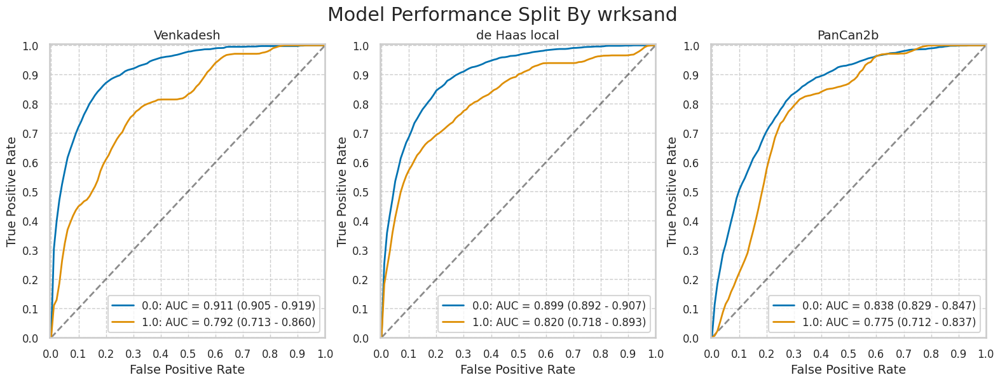

wrkweld


,num,pct,num_mal,pct_mal
0.0,15145,94.208758,1159,7.652691
1.0,931,5.791242,89,9.559613


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15145,1089,4995,8991,70,0.939603,0.357143,0.060397,0.642857,0.178994,0.992275,0.821006,0.007725,0.665566
1.0,931,85,332,510,4,0.955056,0.394299,0.044944,0.605701,0.203837,0.992218,0.796163,0.007782,0.639098


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15145,1106,5962,8024,53,0.954271,0.426283,0.045729,0.573717,0.156480,0.993438,0.843520,0.006562,0.602839
1.0,931,84,382,460,5,0.943820,0.453682,0.056180,0.546318,0.180258,0.989247,0.819742,0.010753,0.584318


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15145,1049,6056,7930,110,0.905091,0.433004,0.094909,0.566996,0.147643,0.986318,0.852357,0.013682,0.592869
1.0,931,81,324,518,8,0.910112,0.384798,0.089888,0.615202,0.200000,0.984791,0.800000,0.015209,0.643394


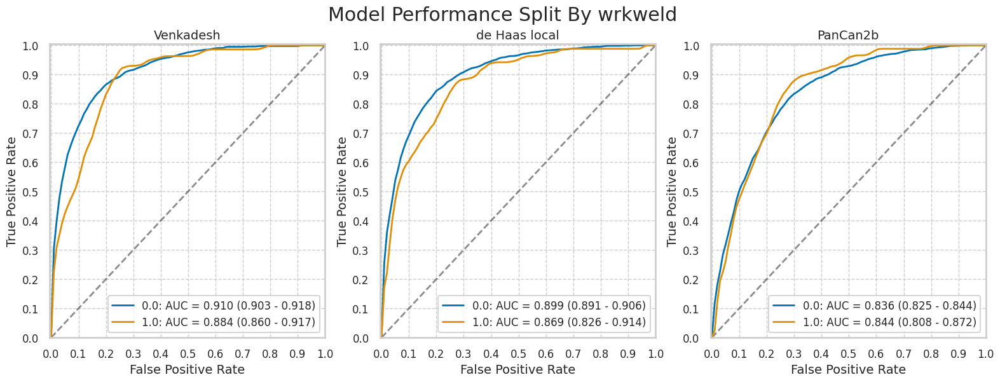

wrknomask


,num,pct,num_mal,pct_mal
False,12041,74.895814,943,7.831575
True,4036,25.104186,306,7.581764


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,12041,884,3928,7170,59,0.937434,0.353938,0.062566,0.646062,0.183707,0.991838,0.816293,0.008162,0.668881
True,4036,291,1399,2331,15,0.950980,0.375067,0.049020,0.624933,0.172189,0.993606,0.827811,0.006394,0.649653


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,12041,905,4684,6414,38,0.959703,0.422058,0.040297,0.577942,0.161925,0.994110,0.838075,0.005890,0.607840
True,4036,286,1660,2070,20,0.934641,0.445040,0.065359,0.554960,0.146968,0.990431,0.853032,0.009569,0.583746


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,12041,854,4764,6334,89,0.905620,0.429267,0.094380,0.570733,0.152011,0.986144,0.847989,0.013856,0.596960
True,4036,277,1616,2114,29,0.905229,0.433244,0.094771,0.566756,0.146329,0.986468,0.853671,0.013532,0.592418


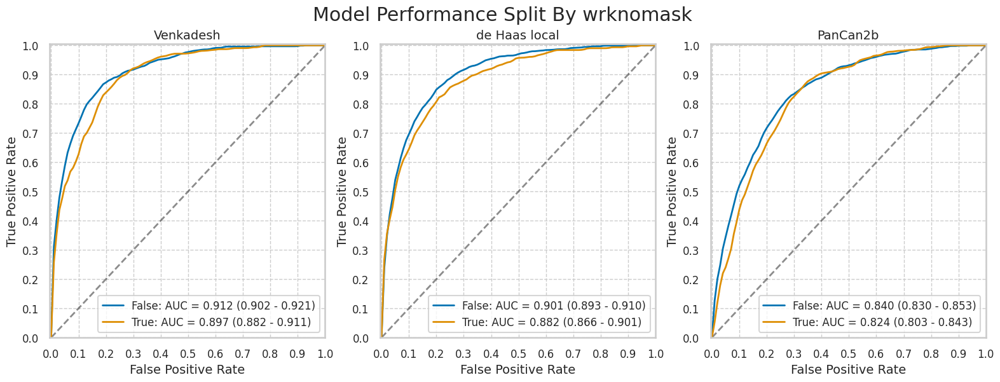

In [14]:
for cat in nlst_democols['cat']['work']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Disease history

,num,pct,num_mal,pct_mal
False,10385,64.595385,697,6.711603
True,5692,35.404615,552,9.697822


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,10385,655,3352,6336,42,0.939742,0.345995,0.060258,0.654005,0.163464,0.993415,0.836536,0.006585,0.673182
True,5692,520,1975,3165,32,0.942029,0.384241,0.057971,0.615759,0.208417,0.989991,0.791583,0.010009,0.647400


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,10385,670,4027,5661,27,0.961263,0.415669,0.038737,0.584331,0.142644,0.995253,0.857356,0.004747,0.609629
True,5692,521,2317,2823,31,0.943841,0.450778,0.056159,0.549222,0.183580,0.989138,0.816420,0.010862,0.587491


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,10385,629,3840,5848,68,0.902439,0.396367,0.097561,0.603633,0.140747,0.988506,0.859253,0.011494,0.623688
True,5692,502,2540,2600,50,0.909420,0.494163,0.090580,0.505837,0.165023,0.981132,0.834977,0.018868,0.544975


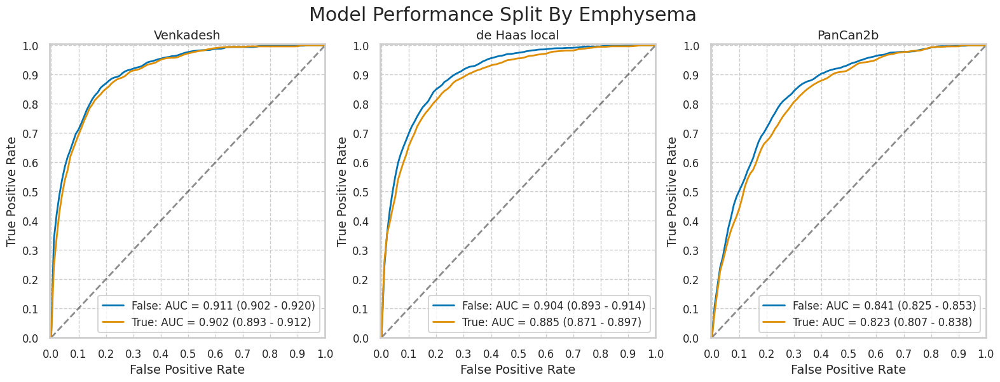

,num,pct,num_mal,pct_mal
False,10385,64.595385,697,6.711603
True,5692,35.404615,552,9.697822


In [15]:
plot_by_category(nlst_preds, 'Emphysema')

diagadas


,num,pct,num_mal,pct_mal
0.0,15015,93.533919,1159,7.718948
1.0,1038,6.466081,85,8.188825


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15015,1095,4929,8927,64,0.944780,0.355730,0.055220,0.644270,0.181773,0.992882,0.818227,0.007118,0.667466
1.0,1038,75,394,559,10,0.882353,0.413431,0.117647,0.586569,0.159915,0.982425,0.840085,0.017575,0.610790


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15015,1110,5863,7993,49,0.957722,0.423138,0.042278,0.576862,0.159185,0.993907,0.840815,0.006093,0.606260
1.0,1038,76,474,479,9,0.894118,0.497377,0.105882,0.502623,0.138182,0.981557,0.861818,0.018443,0.534682


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15015,1049,5870,7986,110,0.905091,0.423643,0.094909,0.576357,0.151612,0.986413,0.848388,0.013587,0.601732
1.0,1038,77,499,454,8,0.905882,0.523610,0.094118,0.476390,0.133681,0.982684,0.866319,0.017316,0.511561


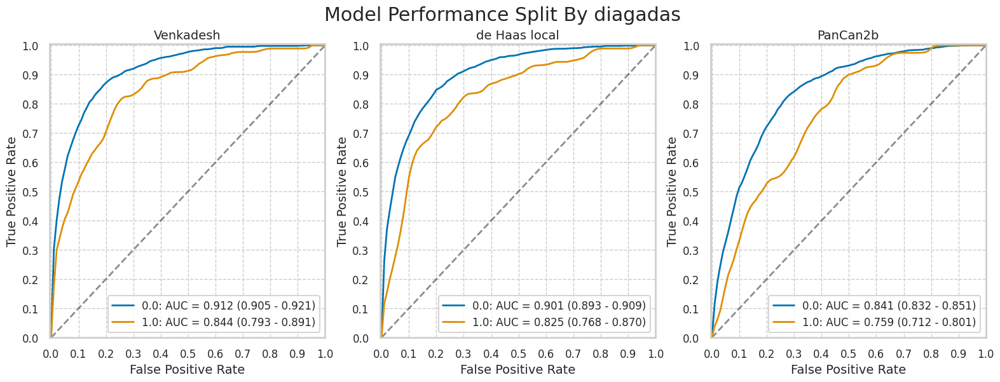

diagasbe


,num,pct,num_mal,pct_mal
0.0,15884,98.910268,1236,7.781415
1.0,175,1.089732,12,6.857143


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15884,1162,5250,9398,74,0.940129,0.358411,0.059871,0.641589,0.181223,0.992188,0.818777,0.007812,0.664820
1.0,175,12,72,91,0,1.000000,0.441718,0.000000,0.558282,0.142857,1.000000,0.857143,0.000000,0.588571


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15884,1178,6266,8382,58,0.953074,0.427772,0.046926,0.572228,0.158248,0.993128,0.841752,0.006872,0.601864
1.0,175,12,68,95,0,1.000000,0.417178,0.000000,0.582822,0.150000,1.000000,0.850000,0.000000,0.611429


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15884,1119,6293,8355,117,0.905340,0.429615,0.094660,0.570385,0.150971,0.986190,0.849029,0.013810,0.596449
1.0,175,11,76,87,1,0.916667,0.466258,0.083333,0.533742,0.126437,0.988636,0.873563,0.011364,0.560000


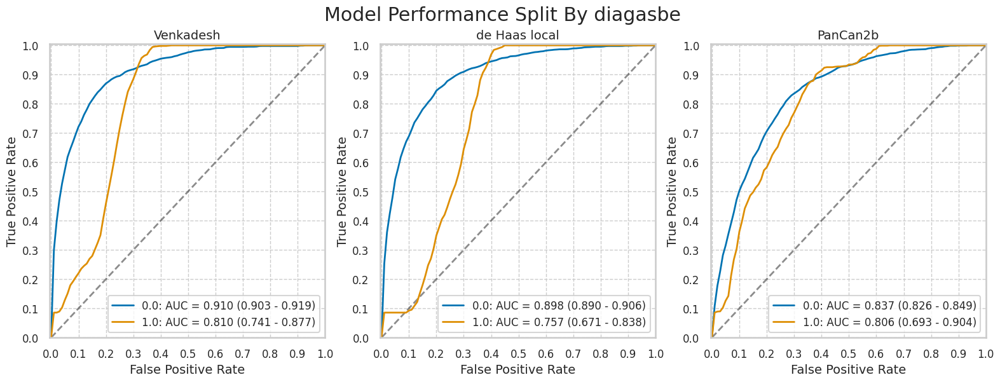

diagbron


,num,pct,num_mal,pct_mal
0.0,15481,96.551079,1214,7.841871
1.0,553,3.448921,28,5.063291


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15481,1140,5141,9126,74,0.939044,0.360342,0.060956,0.639658,0.181500,0.991957,0.818500,0.008043,0.663135
1.0,553,28,177,348,0,1.000000,0.337143,0.000000,0.662857,0.136585,1.000000,0.863415,0.000000,0.679928


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15481,1157,6138,8129,57,0.953048,0.430224,0.046952,0.569776,0.158602,0.993037,0.841398,0.006963,0.599832
1.0,553,28,193,332,0,1.000000,0.367619,0.000000,0.632381,0.126697,1.000000,0.873303,0.000000,0.650995


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15481,1097,6136,8131,117,0.903624,0.430083,0.096376,0.569917,0.151666,0.985815,0.848334,0.014185,0.596086
1.0,553,27,230,295,1,0.964286,0.438095,0.035714,0.561905,0.105058,0.996622,0.894942,0.003378,0.582278


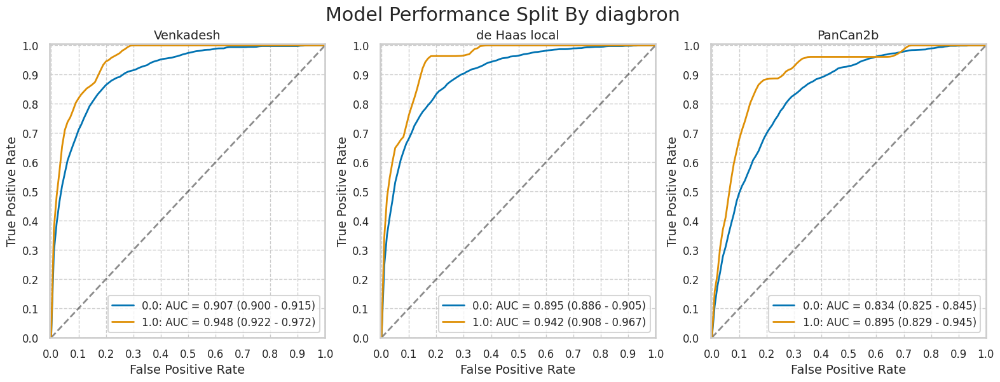

diagchas


,num,pct,num_mal,pct_mal
0.0,15486,96.431907,1222,7.890998
1.0,573,3.568093,26,4.537522


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15486,1150,5130,9134,72,0.941080,0.359647,0.058920,0.640353,0.183121,0.992179,0.816879,0.007821,0.664084
1.0,573,24,193,354,2,0.923077,0.352834,0.076923,0.647166,0.110599,0.994382,0.889401,0.005618,0.659686


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15486,1164,6130,8134,58,0.952537,0.429753,0.047463,0.570247,0.159583,0.99292,0.840417,0.00708,0.600413
1.0,573,26,206,341,0,1.000000,0.376600,0.000000,0.623400,0.112069,1.00000,0.887931,0.00000,0.640489


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15486,1106,6164,8100,116,0.905074,0.432137,0.094926,0.567863,0.152132,0.985881,0.847868,0.014119,0.594472
1.0,573,24,208,339,2,0.923077,0.380256,0.076923,0.619744,0.103448,0.994135,0.896552,0.005865,0.633508


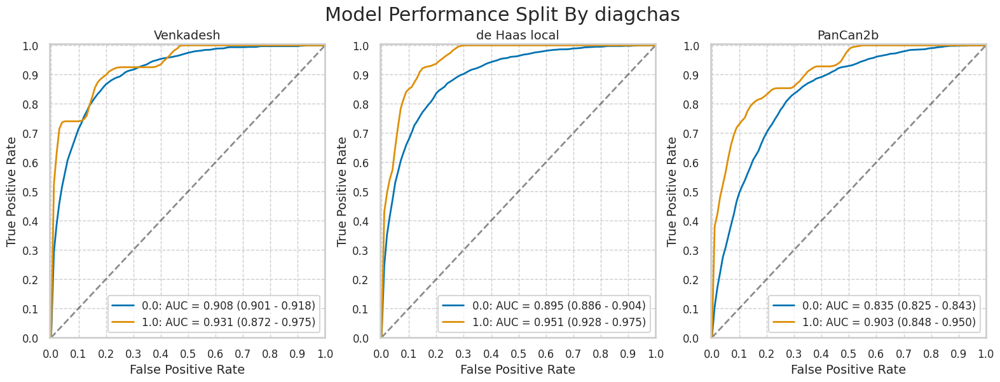

diagchro


,num,pct,num_mal,pct_mal
0.0,14279,89.082288,1125,7.878703
1.0,1750,10.917712,116,6.628571


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14279,1061,4666,8488,64,0.943111,0.354721,0.056889,0.645279,0.185263,0.992516,0.814737,0.007484,0.668744
1.0,1750,106,649,985,10,0.913793,0.397185,0.086207,0.602815,0.140397,0.989950,0.859603,0.010050,0.623429


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14279,1071,5543,7611,54,0.952000,0.421393,0.048000,0.578607,0.161929,0.992955,0.838071,0.007045,0.608026
1.0,1750,112,780,854,4,0.965517,0.477356,0.034483,0.522644,0.125561,0.995338,0.874439,0.004662,0.552000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14279,1018,5527,7627,107,0.904889,0.420176,0.095111,0.579824,0.155539,0.986165,0.844461,0.013835,0.605435
1.0,1750,106,840,794,10,0.913793,0.514076,0.086207,0.485924,0.112051,0.987562,0.887949,0.012438,0.514286


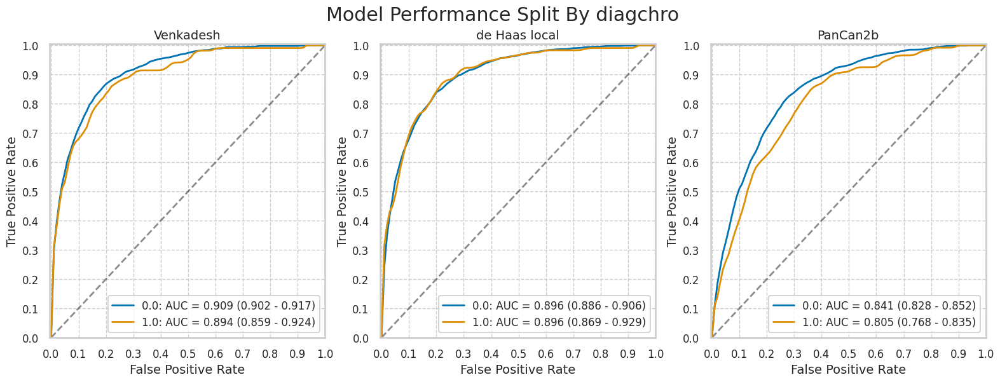

diagcopd


,num,pct,num_mal,pct_mal
0.0,14905,92.947119,1122,7.527675
1.0,1131,7.052881,124,10.963749


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14905,1057,4868,8915,65,0.942068,0.353189,0.057932,0.646811,0.178397,0.992762,0.821603,0.007238,0.669037
1.0,1131,115,444,563,9,0.927419,0.440914,0.072581,0.559086,0.205725,0.984266,0.794275,0.015734,0.599469


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14905,1070,5809,7974,52,0.953654,0.421461,0.046346,0.578539,0.155546,0.993521,0.844454,0.006479,0.606776
1.0,1131,118,517,490,6,0.951613,0.513406,0.048387,0.486594,0.185827,0.987903,0.814173,0.012097,0.537577


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14905,1019,5833,7950,103,0.908200,0.423202,0.091800,0.576798,0.148716,0.987210,0.851284,0.012790,0.601744
1.0,1131,110,526,481,14,0.887097,0.522344,0.112903,0.477656,0.172956,0.971717,0.827044,0.028283,0.522546


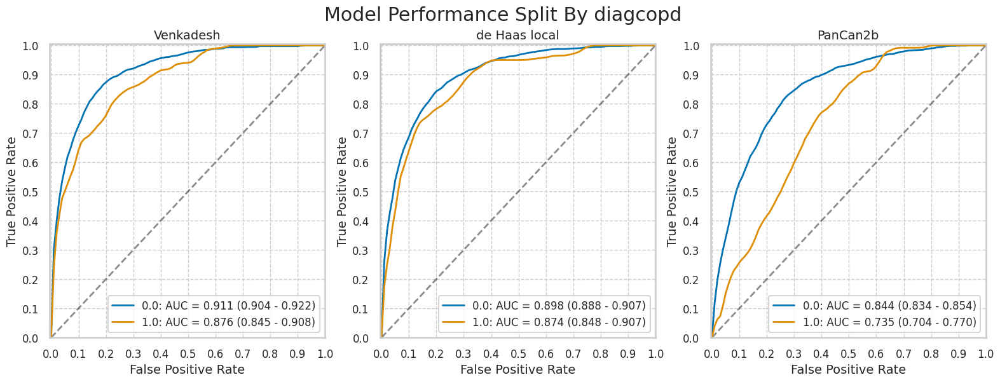

diagdiab


,num,pct,num_mal,pct_mal
0.0,14428,89.838107,1123,7.783477
1.0,1632,10.161893,125,7.659314


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14428,1058,4805,8500,65,0.942119,0.361142,0.057881,0.638858,0.180454,0.992411,0.819546,0.007589,0.662462
1.0,1632,116,519,988,9,0.928000,0.344393,0.072000,0.655607,0.182677,0.990973,0.817323,0.009027,0.676471


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14428,1071,5710,7595,52,0.953695,0.429162,0.046305,0.570838,0.157941,0.993200,0.842059,0.006800,0.600638
1.0,1632,119,623,884,6,0.952000,0.413404,0.048000,0.586596,0.160377,0.993258,0.839623,0.006742,0.614583


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14428,1014,5728,7577,109,0.902939,0.430515,0.097061,0.569485,0.150400,0.985818,0.849600,0.014182,0.595439
1.0,1632,116,645,862,9,0.928000,0.428003,0.072000,0.571997,0.152431,0.989667,0.847569,0.010333,0.599265


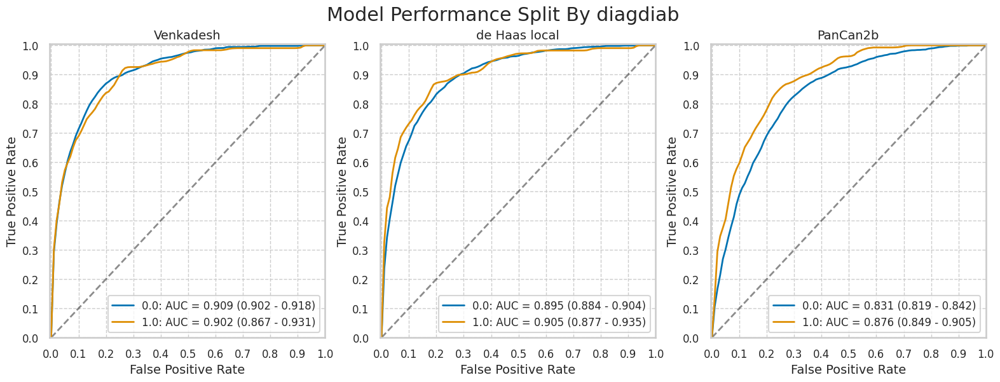

diagemph


,num,pct,num_mal,pct_mal
0.0,14283,89.057239,1090,7.631450
1.0,1755,10.942761,156,8.888889


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14283,1024,4614,8579,66,0.939450,0.349731,0.060550,0.650269,0.181625,0.992366,0.818375,0.007634,0.672338
1.0,1755,148,707,892,8,0.948718,0.442151,0.051282,0.557849,0.173099,0.991111,0.826901,0.008889,0.592593


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14283,1038,5552,7641,52,0.952294,0.420829,0.047706,0.579171,0.157511,0.993241,0.842489,0.006759,0.607645
1.0,1755,150,781,818,6,0.961538,0.488430,0.038462,0.511570,0.161117,0.992718,0.838883,0.007282,0.551567


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,14283,988,5591,7602,102,0.906422,0.423785,0.093578,0.576215,0.150175,0.986760,0.849825,0.013240,0.601414
1.0,1755,141,773,826,15,0.903846,0.483427,0.096154,0.516573,0.154267,0.982164,0.845733,0.017836,0.550997


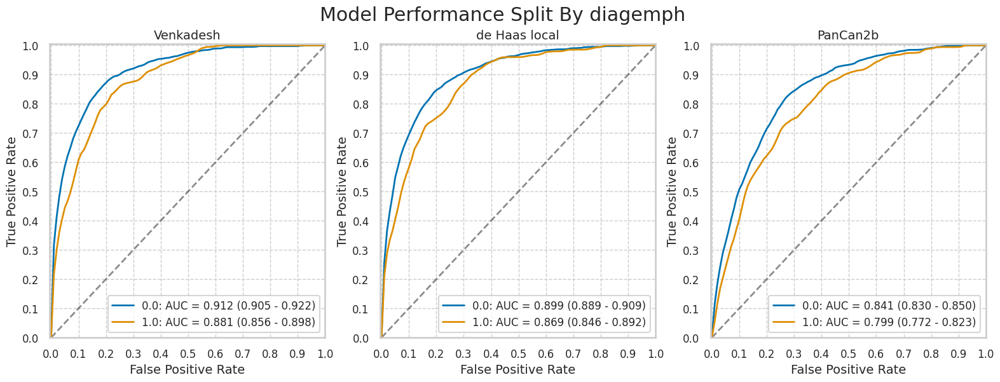

diagfibr


,num,pct,num_mal,pct_mal
0.0,16016,99.750872,1243,7.760989
1.0,40,0.249128,5,12.500000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16016,1169,5304,9469,74,0.940467,0.359033,0.059533,0.640967,0.180596,0.992246,0.819404,0.007754,0.664211
1.0,40,5,19,16,0,1.000000,0.542857,0.000000,0.457143,0.208333,1.000000,0.791667,0.000000,0.525000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16016,1185,6319,8454,58,0.953339,0.427740,0.046661,0.572260,0.157916,0.993186,0.842084,0.006814,0.601836
1.0,40,5,16,19,0,1.000000,0.457143,0.000000,0.542857,0.238095,1.000000,0.761905,0.000000,0.600000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16016,1125,6352,8421,118,0.905068,0.429974,0.094932,0.570026,0.150461,0.986181,0.849539,0.013819,0.596029
1.0,40,5,18,17,0,1.000000,0.514286,0.000000,0.485714,0.217391,1.000000,0.782609,0.000000,0.550000


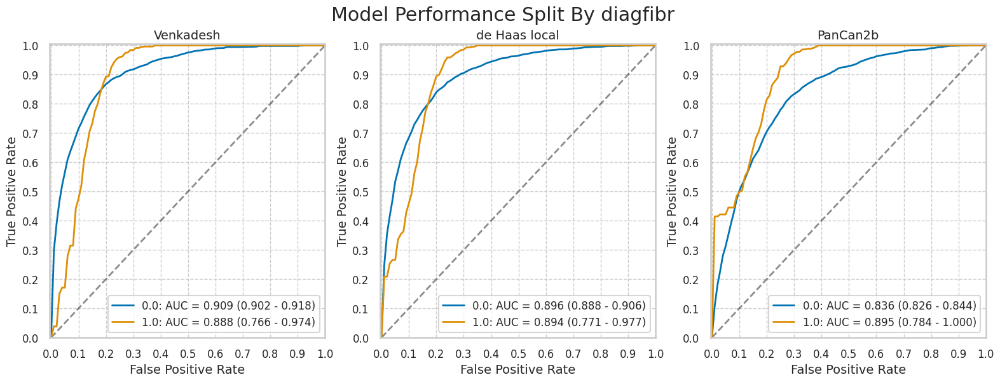

diaghear


,num,pct,num_mal,pct_mal
0.0,13869,86.529823,1067,7.693417
1.0,2159,13.470177,179,8.290875


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,13869,1003,4537,8265,64,0.940019,0.354398,0.059981,0.645602,0.181047,0.992316,0.818953,0.007684,0.668253
1.0,2159,170,782,1198,9,0.949721,0.394949,0.050279,0.605051,0.178571,0.992543,0.821429,0.007457,0.633627


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,13869,1014,5435,7367,53,0.950328,0.424543,0.049672,0.575457,0.157234,0.992857,0.842766,0.007143,0.604297
1.0,2159,175,893,1087,4,0.977654,0.451010,0.022346,0.548990,0.163858,0.996334,0.836142,0.003666,0.584530


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,13869,966,5442,7360,101,0.905342,0.425090,0.094658,0.574910,0.150749,0.986463,0.849251,0.013537,0.600332
1.0,2159,162,914,1066,17,0.905028,0.461616,0.094972,0.538384,0.150558,0.984303,0.849442,0.015697,0.568782


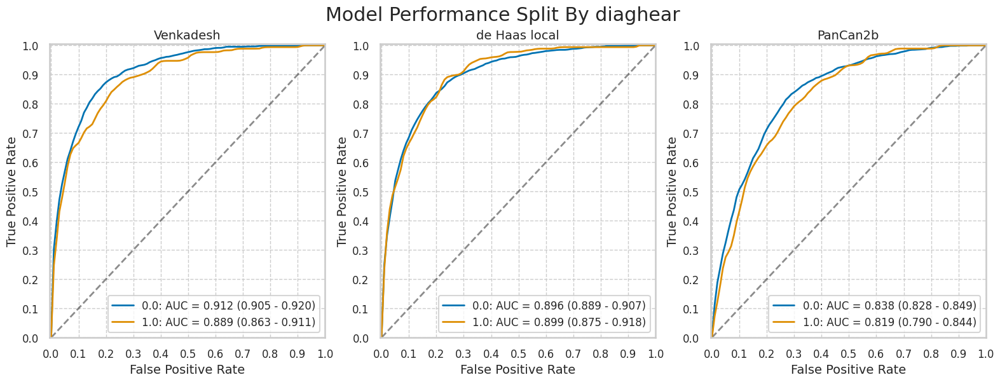

diaghype


,num,pct,num_mal,pct_mal
0.0,10489,65.364243,798,7.607970
1.0,5558,34.635757,445,8.006477


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,10489,759,3416,6275,39,0.951128,0.352492,0.048872,0.647508,0.181796,0.993823,0.818204,0.006177,0.670607
1.0,5558,410,1902,3211,35,0.921348,0.371993,0.078652,0.628007,0.177336,0.989217,0.822664,0.010783,0.651493


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,10489,765,4044,5647,33,0.958647,0.417294,0.041353,0.582706,0.159077,0.994190,0.840923,0.005810,0.611307
1.0,5558,421,2287,2826,24,0.946067,0.447291,0.053933,0.552709,0.155465,0.991579,0.844535,0.008421,0.584203


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,10489,730,4034,5657,68,0.914787,0.416263,0.085213,0.583737,0.153233,0.988122,0.846767,0.011878,0.608924
1.0,5558,395,2332,2781,50,0.887640,0.456092,0.112360,0.543908,0.144848,0.982338,0.855152,0.017662,0.571429


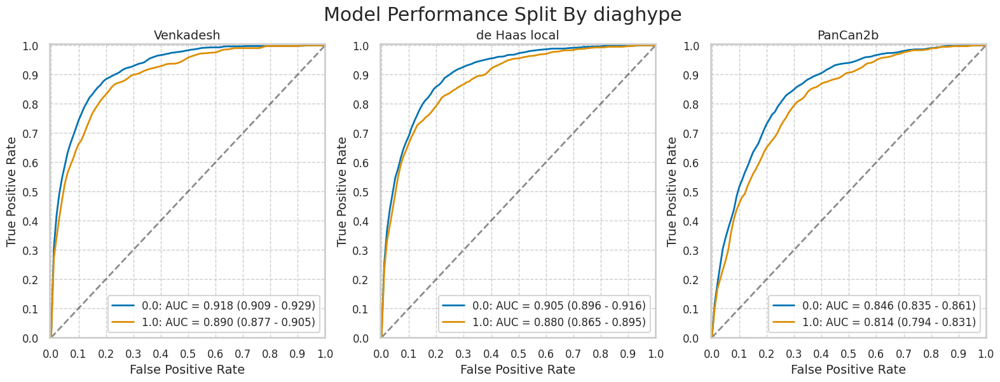

diagpneu


,num,pct,num_mal,pct_mal
0.0,12297,76.602504,946,7.692933
1.0,3756,23.397496,296,7.880724


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,12297,890,3978,7373,56,0.940803,0.350454,0.059197,0.649546,0.182827,0.992462,0.817173,0.007538,0.671953
1.0,3756,280,1346,2114,16,0.945946,0.389017,0.054054,0.610983,0.172202,0.992488,0.827798,0.007512,0.637380


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,12297,902,4828,6523,44,0.953488,0.425337,0.046512,0.574663,0.157417,0.993300,0.842583,0.006700,0.603806
1.0,3756,286,1510,1950,10,0.966216,0.436416,0.033784,0.563584,0.159243,0.994898,0.840757,0.005102,0.595314


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,12297,853,4680,6671,93,0.901691,0.412298,0.098309,0.587702,0.154166,0.986251,0.845834,0.013749,0.611857
1.0,3756,272,1692,1768,24,0.918919,0.489017,0.081081,0.510983,0.138493,0.986607,0.861507,0.013393,0.543131


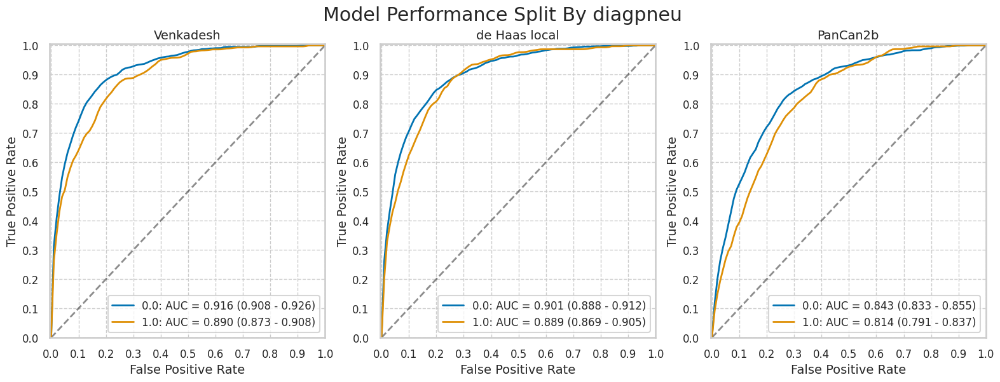

diagsarc


,num,pct,num_mal,pct_mal
0.0,16021,99.819315,1241,7.746083
1.0,29,0.180685,5,17.241379


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16021,1167,5310,9470,74,0.940371,0.359269,0.059629,0.640731,0.180176,0.992246,0.819824,0.007754,0.663941
1.0,29,5,9,15,0,1.000000,0.375000,0.000000,0.625000,0.357143,1.000000,0.642857,0.000000,0.689655


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16021,1183,6318,8462,58,0.953263,0.42747,0.046737,0.57253,0.157712,0.993192,0.842288,0.006808,0.602022
1.0,29,5,15,9,0,1.000000,0.62500,0.000000,0.37500,0.250000,1.000000,0.750000,0.000000,0.482759


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16021,1123,6360,8420,118,0.904915,0.430311,0.095085,0.569689,0.150073,0.986179,0.849927,0.013821,0.595656
1.0,29,5,7,17,0,1.000000,0.291667,0.000000,0.708333,0.416667,1.000000,0.583333,0.000000,0.758621


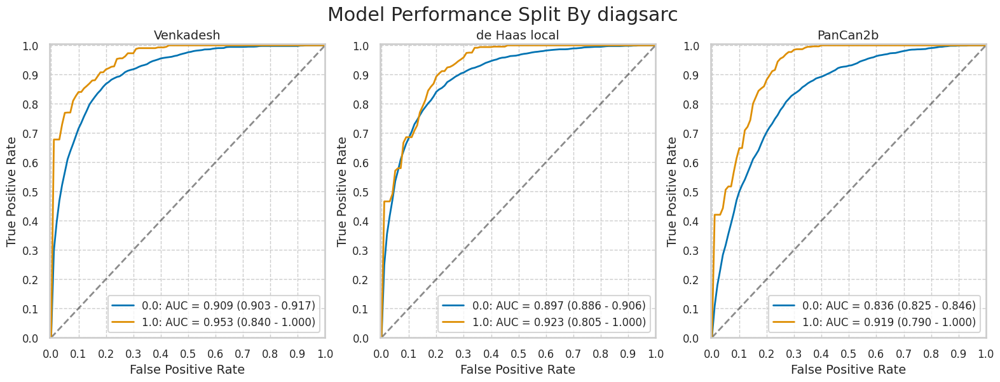

diagsili


,num,pct,num_mal,pct_mal
0.0,16030,99.875389,1242,7.747973
1.0,20,0.124611,4,20.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1168,5311,9477,74,0.940419,0.359143,0.059581,0.640857,0.180275,0.992252,0.819725,0.007748,0.664067
1.0,20,4,8,8,0,1.000000,0.500000,0.000000,0.500000,0.333333,1.000000,0.666667,0.000000,0.600000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1184,6321,8467,58,0.953301,0.427441,0.046699,0.572559,0.157761,0.993196,0.842239,0.006804,0.602059
1.0,20,4,12,4,0,1.000000,0.750000,0.000000,0.250000,0.250000,1.000000,0.750000,0.000000,0.400000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1124,6356,8432,118,0.904992,0.429808,0.095008,0.570192,0.150267,0.986199,0.849733,0.013801,0.596132
1.0,20,4,11,5,0,1.000000,0.687500,0.000000,0.312500,0.266667,1.000000,0.733333,0.000000,0.450000


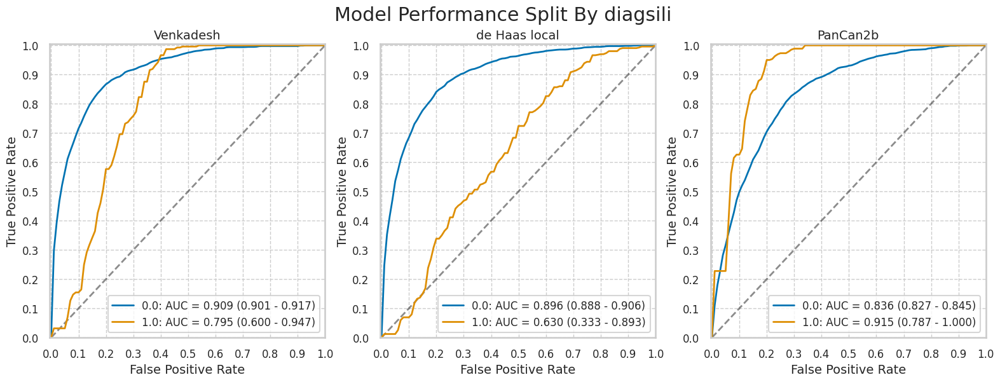

diagstro


,num,pct,num_mal,pct_mal
0.0,15599,97.11742,1205,7.724854
1.0,463,2.88258,43,9.287257


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15599,1134,5195,9199,71,0.941079,0.360914,0.058921,0.639086,0.179175,0.992341,0.820825,0.007659,0.662414
1.0,463,40,129,291,3,0.930233,0.307143,0.069767,0.692857,0.236686,0.989796,0.763314,0.010204,0.714903


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15599,1148,6146,8248,57,0.952697,0.426983,0.047303,0.573017,0.157390,0.993137,0.842610,0.006863,0.602346
1.0,463,42,190,230,1,0.976744,0.452381,0.023256,0.547619,0.181034,0.995671,0.818966,0.004329,0.587473


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15599,1091,6173,8221,114,0.905394,0.428859,0.094606,0.571141,0.150193,0.986323,0.849807,0.013677,0.596961
1.0,463,39,201,219,4,0.906977,0.478571,0.093023,0.521429,0.162500,0.982063,0.837500,0.017937,0.557235


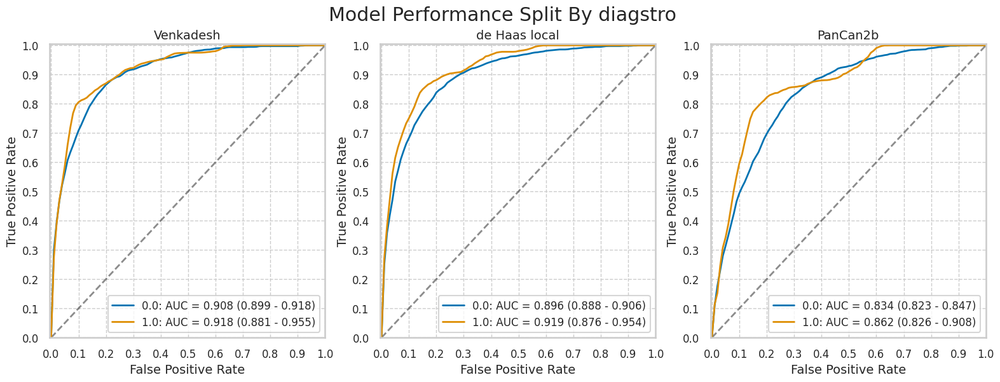

diagtube


,num,pct,num_mal,pct_mal
0.0,15892,98.966247,1231,7.746036
1.0,166,1.033753,14,8.433735


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15892,1158,5248,9413,73,0.940699,0.357956,0.059301,0.642044,0.180768,0.992304,0.819232,0.007696,0.665177
1.0,166,13,76,76,1,0.928571,0.500000,0.071429,0.500000,0.146067,0.987013,0.853933,0.012987,0.536145


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15892,1174,6257,8404,57,0.953696,0.426779,0.046304,0.573221,0.157987,0.993263,0.842013,0.006737,0.602693
1.0,166,13,80,72,1,0.928571,0.526316,0.071429,0.473684,0.139785,0.986301,0.860215,0.013699,0.512048


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15892,1116,6294,8367,115,0.906580,0.429302,0.093420,0.570698,0.150607,0.986442,0.849393,0.013558,0.596715
1.0,166,12,79,73,2,0.857143,0.519737,0.142857,0.480263,0.131868,0.973333,0.868132,0.026667,0.512048


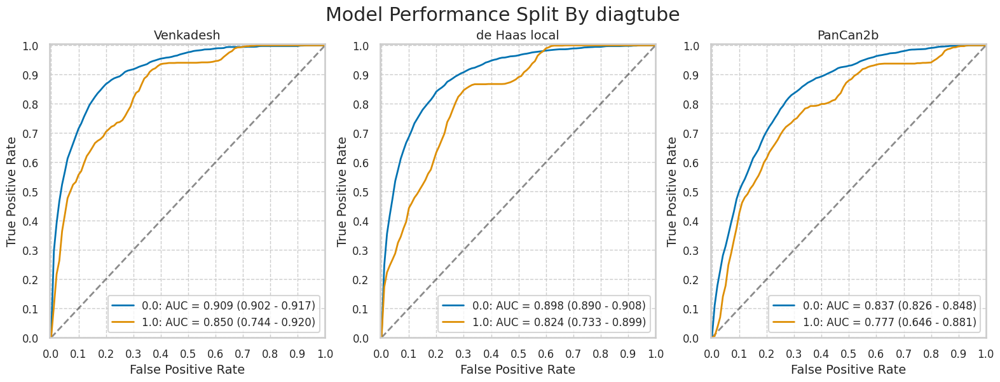

In [16]:
for cat in nlst_democols['cat']['disease']:
    print(cat)
    plot_by_category(nlst_preds, cat)

### Personal cancer history

cancblad


,num,pct,num_mal,pct_mal
0.0,15929,99.277033,1234,7.746877
1.0,116,0.722967,11,9.482759


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15929,1160,5270,9425,74,0.940032,0.358625,0.059968,0.641375,0.180404,0.99221,0.819596,0.00779,0.664511
1.0,116,11,45,60,0,1.000000,0.428571,0.000000,0.571429,0.196429,1.00000,0.803571,0.00000,0.612069


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15929,1176,6283,8412,58,0.952998,0.427560,0.047002,0.572440,0.157662,0.993152,0.842338,0.006848,0.601921
1.0,116,11,46,59,0,1.000000,0.438095,0.000000,0.561905,0.192982,1.000000,0.807018,0.000000,0.603448


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15929,1116,6318,8377,118,0.904376,0.429942,0.095624,0.570058,0.150121,0.986109,0.849879,0.013891,0.595957
1.0,116,11,48,57,0,1.000000,0.457143,0.000000,0.542857,0.186441,1.000000,0.813559,0.000000,0.586207


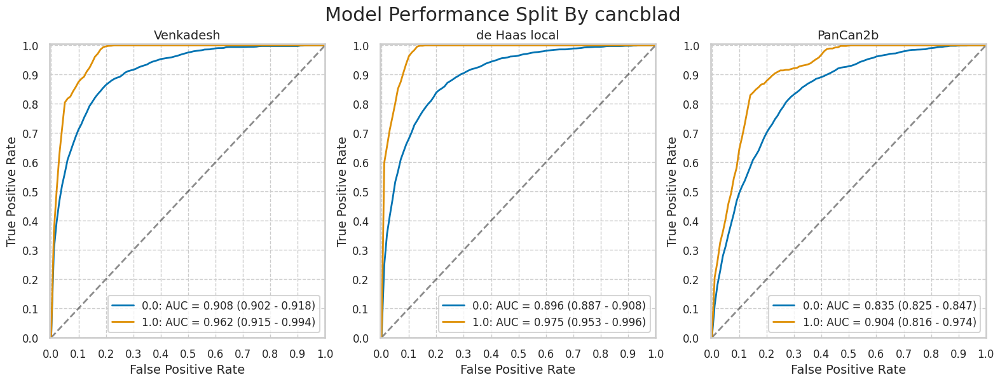

cancbrea


,num,pct,num_mal,pct_mal
0.0,15820,98.597694,1218,7.699115
1.0,225,1.402306,27,12.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15820,1145,5239,9363,73,0.940066,0.358786,0.059934,0.641214,0.179355,0.992264,0.820645,0.007736,0.664223
1.0,225,26,80,118,1,0.962963,0.404040,0.037037,0.595960,0.245283,0.991597,0.754717,0.008403,0.640000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15820,1160,6242,8360,58,0.952381,0.427476,0.047619,0.572524,0.156714,0.99311,0.843286,0.00689,0.601770
1.0,225,27,89,109,0,1.000000,0.449495,0.000000,0.550505,0.232759,1.00000,0.767241,0.00000,0.604444


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15820,1102,6259,8343,116,0.904762,0.428640,0.095238,0.571360,0.149708,0.986287,0.850292,0.013713,0.597029
1.0,225,25,106,92,2,0.925926,0.535354,0.074074,0.464646,0.190840,0.978723,0.809160,0.021277,0.520000


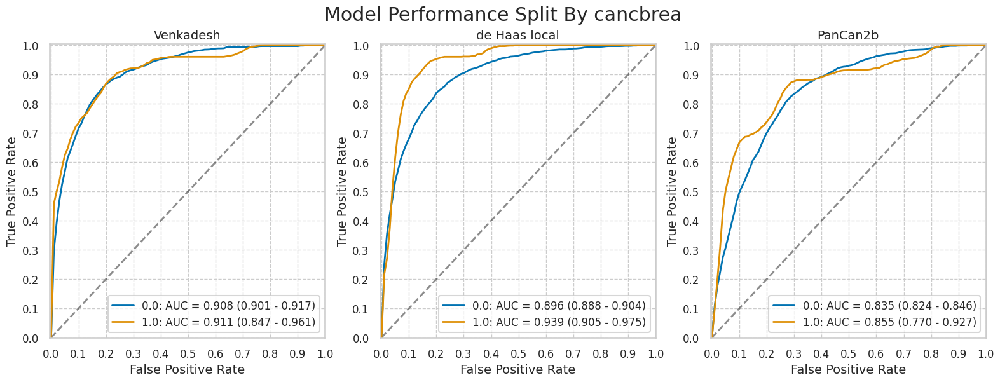

canccerv


,num,pct,num_mal,pct_mal
0.0,15817,98.548287,1227,7.757476
1.0,233,1.451713,18,7.725322


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15817,1156,5249,9341,71,0.942135,0.359767,0.057865,0.640233,0.180484,0.992456,0.819516,0.007544,0.663653
1.0,233,15,69,146,3,0.833333,0.320930,0.166667,0.679070,0.178571,0.979866,0.821429,0.020134,0.690987


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15817,1169,6230,8360,58,0.95273,0.427005,0.04727,0.572995,0.157994,0.99311,0.842006,0.00689,0.602453
1.0,233,18,101,114,0,1.00000,0.469767,0.00000,0.530233,0.151261,1.00000,0.848739,0.00000,0.566524


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15817,1111,6247,8343,116,0.905460,0.428170,0.094540,0.571830,0.150992,0.986287,0.849008,0.013713,0.597711
1.0,233,16,117,98,2,0.888889,0.544186,0.111111,0.455814,0.120301,0.980000,0.879699,0.020000,0.489270


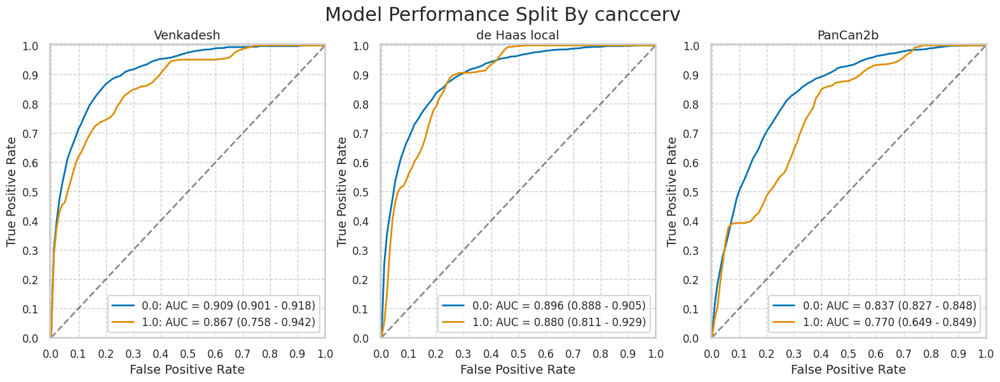

canccolo


,num,pct,num_mal,pct_mal
0.0,15982,99.563917,1243,7.777500
1.0,70,0.436083,2,2.857143


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15982,1169,5298,9441,74,0.940467,0.359455,0.059533,0.640545,0.180764,0.992223,0.819236,0.007777,0.663872
1.0,70,2,21,47,0,1.000000,0.308824,0.000000,0.691176,0.086957,1.000000,0.913043,0.000000,0.700000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15982,1185,6309,8430,58,0.953339,0.428048,0.046661,0.571952,0.158127,0.993167,0.841873,0.006833,0.601614
1.0,70,2,24,44,0,1.000000,0.352941,0.000000,0.647059,0.076923,1.000000,0.923077,0.000000,0.657143


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,15982,1125,6338,8401,118,0.905068,0.430016,0.094932,0.569984,0.150744,0.986149,0.849256,0.013851,0.596046
1.0,70,2,28,40,0,1.000000,0.411765,0.000000,0.588235,0.066667,1.000000,0.933333,0.000000,0.600000


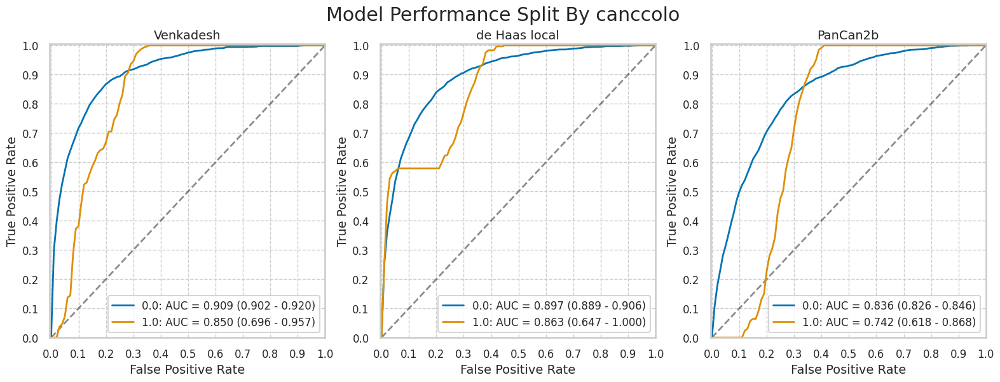

cancesop


,num,pct,num_mal,pct_mal
0.0,16042,99.937702,1245,7.760878
1.0,10,0.062298,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
canckidn


,num,pct,num_mal,pct_mal
0.0,16030,99.862945,1241,7.741734
1.0,22,0.137055,4,18.181818


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1167,5305,9484,74,0.940371,0.358713,0.059629,0.641287,0.180315,0.992258,0.819685,0.007742,0.664442
1.0,22,4,14,4,0,1.000000,0.777778,0.000000,0.222222,0.222222,1.000000,0.777778,0.000000,0.363636


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1183,6323,8466,58,0.953263,0.427548,0.046737,0.572452,0.157607,0.993196,0.842393,0.006804,0.601934
1.0,22,4,10,8,0,1.000000,0.555556,0.000000,0.444444,0.285714,1.000000,0.714286,0.000000,0.545455


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1123,6355,8434,118,0.904915,0.429711,0.095085,0.570289,0.150174,0.986202,0.849826,0.013798,0.596195
1.0,22,4,11,7,0,1.000000,0.611111,0.000000,0.388889,0.266667,1.000000,0.733333,0.000000,0.500000


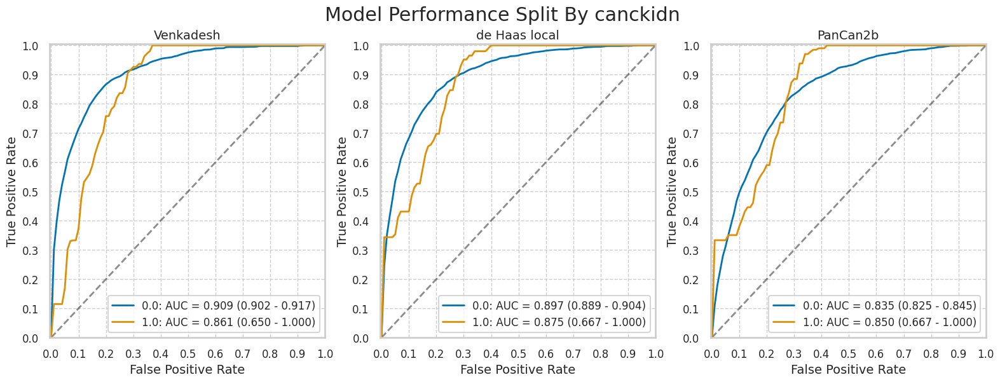

canclary


,num,pct,num_mal,pct_mal
0.0,16042,99.937702,1244,7.754644
1.0,10,0.062298,1,10.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16042,1170,5315,9483,74,0.940514,0.359170,0.059486,0.640830,0.180416,0.992257,0.819584,0.007743,0.664069
1.0,10,1,4,5,0,1.000000,0.444444,0.000000,0.555556,0.200000,1.000000,0.800000,0.000000,0.600000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16042,1186,6330,8468,58,0.953376,0.427761,0.046624,0.572239,0.157797,0.993197,0.842203,0.006803,0.601795
1.0,10,1,3,6,0,1.000000,0.333333,0.000000,0.666667,0.250000,1.000000,0.750000,0.000000,0.700000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16042,1126,6361,8437,118,0.905145,0.429855,0.094855,0.570145,0.150394,0.986207,0.849606,0.013793,0.596123
1.0,10,1,5,4,0,1.000000,0.555556,0.000000,0.444444,0.166667,1.000000,0.833333,0.000000,0.500000


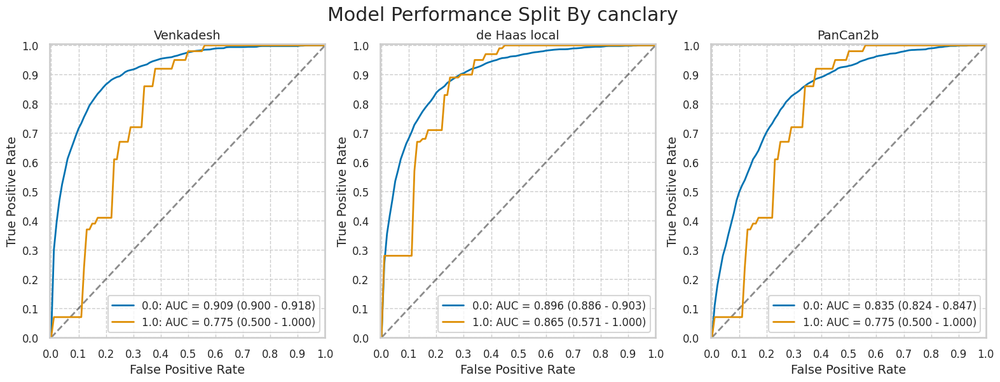

canclung


,num,pct,num_mal,pct_mal
0.0,16048,99.975081,1242,7.739282
1.0,4,0.024919,3,75.000000


Venkadesh


/mnt/c/Users/shaur/github/thesis-repo-xps/utils.py:112: RuntimeWarning: invalid value encountered in scalar divide
  "npv": tn / (tn + fn), ## negative predictive value
/mnt/c/Users/shaur/github/thesis-repo-xps/utils.py:114: RuntimeWarning: invalid value encountered in scalar divide
  "for": fn / (fn + tn), ## False omission rate,


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16048,1168,5318,9488,74,0.940419,0.359179,0.059581,0.640821,0.18008,0.992261,0.81992,0.007739,0.664008
1.0,4,3,1,0,0,1.000000,1.000000,0.000000,0.000000,0.75000,NaN,0.25000,NaN,0.750000


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16048,1184,6333,8473,58,0.953301,0.427732,0.046699,0.572268,0.15751,0.993201,0.84249,0.006799,0.601757
1.0,4,3,0,1,0,1.000000,0.000000,0.000000,1.000000,1.00000,1.000000,0.00000,0.000000,1.000000


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16048,1124,6366,8440,118,0.904992,0.429961,0.095008,0.570039,0.150067,0.986212,0.849933,0.013788,0.595962
1.0,4,3,0,1,0,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000


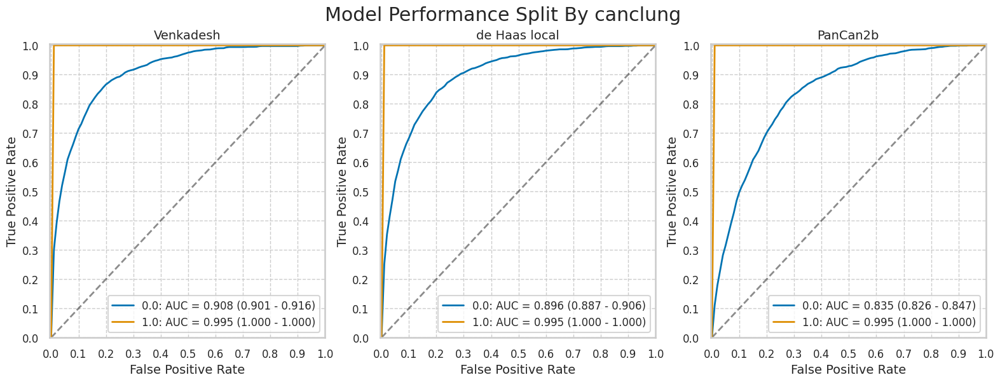

cancnasa


,num,pct,num_mal,pct_mal
0.0,16030,99.931426,1242,7.747973
1.0,11,0.068574,1,9.090909


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1168,5313,9475,74,0.940419,0.359278,0.059581,0.640722,0.180219,0.99225,0.819781,0.00775,0.663943
1.0,11,1,6,4,0,1.000000,0.600000,0.000000,0.400000,0.142857,1.00000,0.857143,0.00000,0.454545


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1184,6325,8463,58,0.953301,0.427712,0.046699,0.572288,0.157677,0.993193,0.842323,0.006807,0.601809
1.0,11,1,6,4,0,1.000000,0.600000,0.000000,0.400000,0.142857,1.000000,0.857143,0.000000,0.454545


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16030,1124,6359,8429,118,0.904992,0.430011,0.095008,0.569989,0.150207,0.986194,0.849793,0.013806,0.595945
1.0,11,1,7,3,0,1.000000,0.700000,0.000000,0.300000,0.125000,1.000000,0.875000,0.000000,0.363636


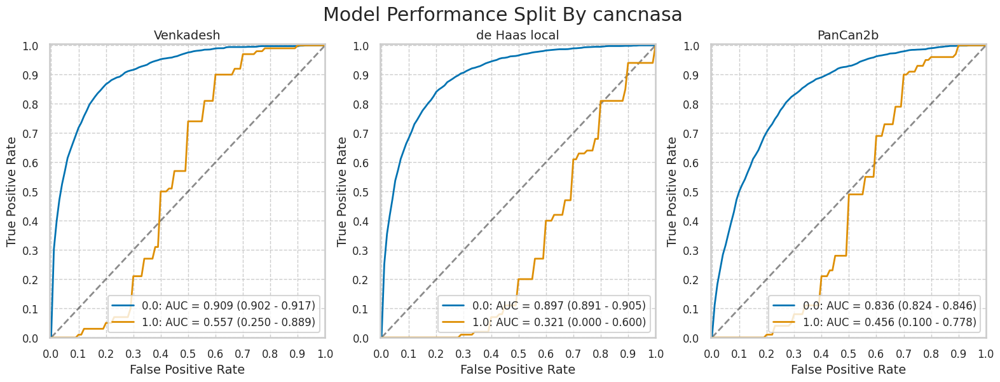

cancoral


,num,pct,num_mal,pct_mal
0.0,16029,99.862937,1234,7.698546
1.0,22,0.137063,11,50.000000


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16029,1160,5314,9481,74,0.940032,0.359175,0.059968,0.640825,0.179178,0.992255,0.820822,0.007745,0.663859
1.0,22,11,5,6,0,1.000000,0.454545,0.000000,0.545455,0.687500,1.000000,0.312500,0.000000,0.772727


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16029,1176,6330,8465,58,0.952998,0.427847,0.047002,0.572153,0.156675,0.993195,0.843325,0.006805,0.601472
1.0,22,11,3,8,0,1.000000,0.272727,0.000000,0.727273,0.785714,1.000000,0.214286,0.000000,0.863636


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16029,1116,6362,8433,118,0.904376,0.430010,0.095624,0.569990,0.149238,0.9862,0.850762,0.0138,0.595733
1.0,22,11,4,7,0,1.000000,0.363636,0.000000,0.636364,0.733333,1.0000,0.266667,0.0000,0.818182


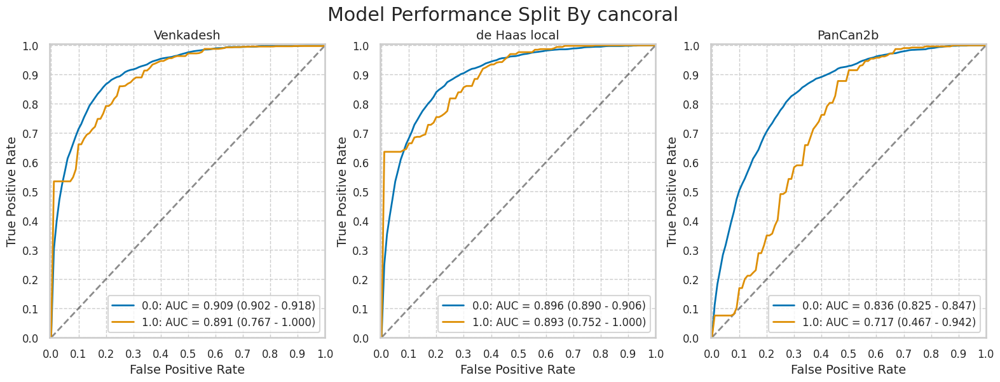

cancpanc


,num,pct,num_mal,pct_mal
0.0,16052,100.0,1245,7.756043


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16052,1171,5319,9488,74,0.940562,0.359222,0.059438,0.640778,0.180431,0.992261,0.819569,0.007739,0.664029


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16052,1187,6333,8474,58,0.953414,0.427703,0.046586,0.572297,0.157846,0.993202,0.842154,0.006798,0.601856


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16052,1127,6366,8441,118,0.905221,0.429932,0.094779,0.570068,0.150407,0.986213,0.849593,0.013787,0.596063


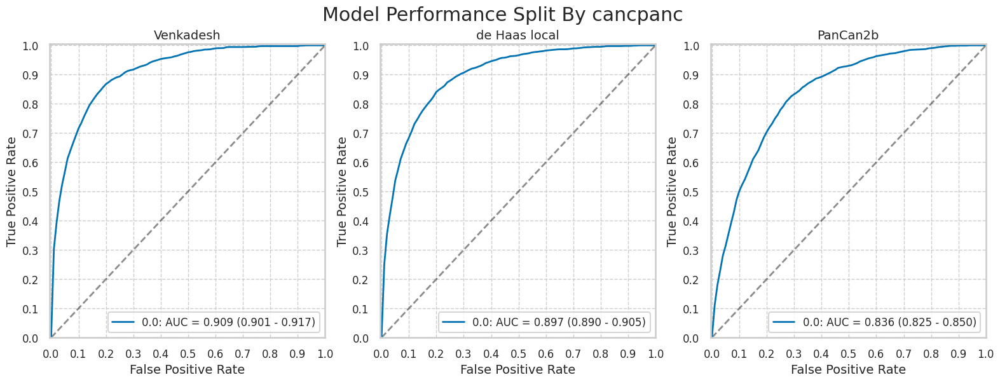

cancphar


,num,pct,num_mal,pct_mal
0.0,16046,99.962621,1245,7.758943
1.0,6,0.037379,0,0.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
cancstom


,num,pct,num_mal,pct_mal
0.0,16034,99.887864,1245,7.76475
1.0,18,0.112136,0,0.00000


Not plotting ROC since there are zero values for malignant or benign nodules :(
cancthyr


,num,pct,num_mal,pct_mal
0.0,16017,99.862834,1242,7.754261
1.0,22,0.137166,3,13.636364


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16017,1168,5300,9475,74,0.940419,0.358714,0.059581,0.641286,0.180581,0.99225,0.819419,0.00775,0.664481
1.0,22,3,13,6,0,1.000000,0.684211,0.000000,0.315789,0.187500,1.00000,0.812500,0.00000,0.409091


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16017,1184,6311,8464,58,0.953301,0.427140,0.046699,0.572860,0.157972,0.993194,0.842028,0.006806,0.602360
1.0,22,3,15,4,0,1.000000,0.789474,0.000000,0.210526,0.166667,1.000000,0.833333,0.000000,0.318182


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
0.0,16017,1124,6348,8427,118,0.904992,0.429645,0.095008,0.570355,0.150428,0.986191,0.849572,0.013809,0.596304
1.0,22,3,12,7,0,1.000000,0.631579,0.000000,0.368421,0.200000,1.000000,0.800000,0.000000,0.454545


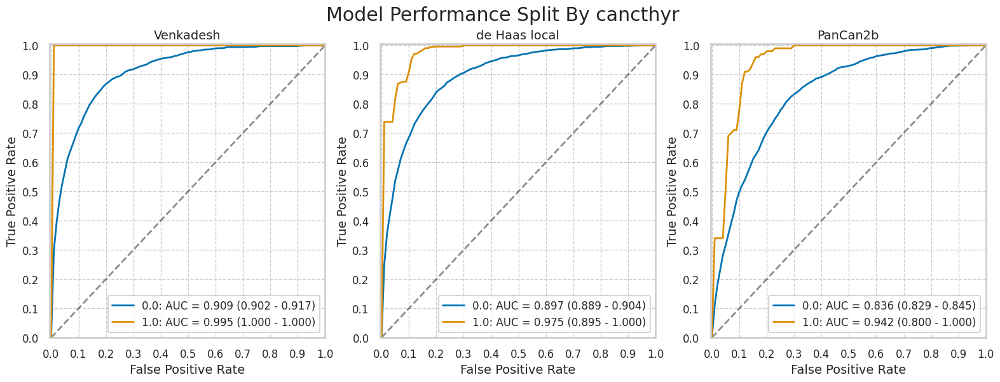

canctran


,num,pct,num_mal,pct_mal
0.0,16042,99.993767,1242,7.742177
1.0,1,0.006233,1,100.000000


Not plotting ROC since there are zero values for malignant or benign nodules :(
FamilyHistoryLungCa


,num,pct,num_mal,pct_mal
False,11979,74.51017,870,7.262710
True,4098,25.48983,379,9.248414


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,11979,821,3975,7134,49,0.943678,0.357818,0.056322,0.642182,0.171184,0.993178,0.828816,0.006822,0.664079
True,4098,354,1352,2367,25,0.934037,0.363539,0.065963,0.636461,0.207503,0.989548,0.792497,0.010452,0.663982


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,11979,834,4691,6418,36,0.958621,0.422270,0.041379,0.577730,0.150950,0.994422,0.849050,0.005578,0.605393
True,4098,357,1653,2066,22,0.941953,0.444474,0.058047,0.555526,0.177612,0.989464,0.822388,0.010536,0.591264


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,11979,781,4555,6554,89,0.897701,0.410028,0.102299,0.589972,0.146364,0.986602,0.853636,0.013398,0.612322
True,4098,350,1825,1894,29,0.923483,0.490723,0.076517,0.509277,0.160920,0.984919,0.839080,0.015081,0.547584


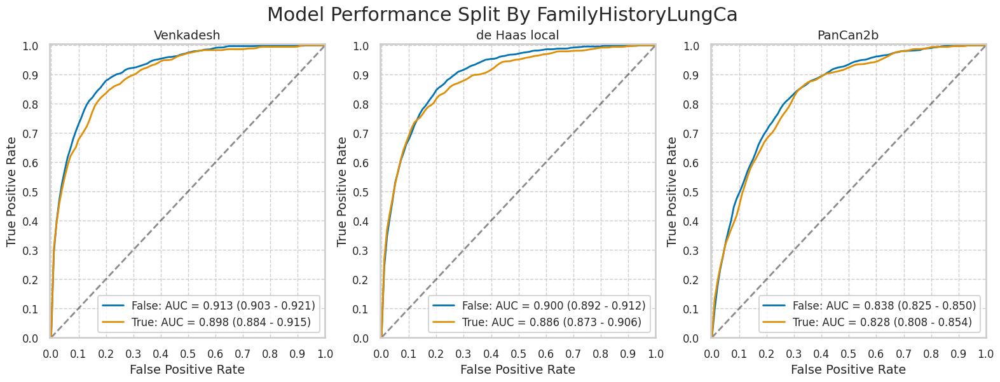

In [17]:
for cat in nlst_democols['cat']['canchist']:
    print(cat)
    plot_by_category(nlst_preds, cat)

## Binning for numerical columns

### Demographic columns

height


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14808.0,67.978863,3.925579,53.0,65.0,68.0,71.0,83.0
1,1246.0,67.788925,3.950851,49.0,65.0,68.0,71.0,76.0


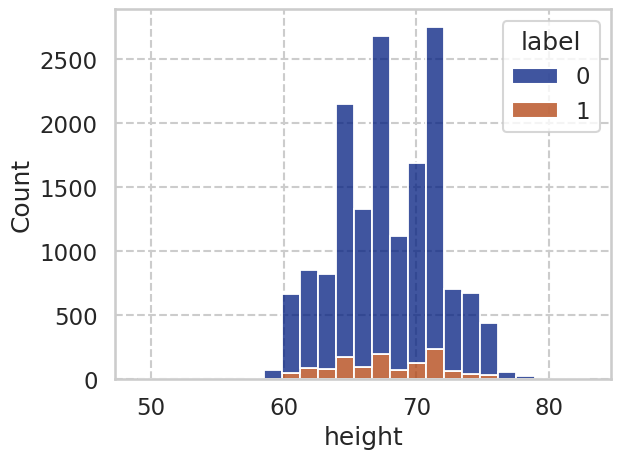

weight


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14799.0,182.976552,39.067503,75.0,155.0,180.0,207.0,368.0
1,1243.0,175.740145,35.842933,95.0,150.0,174.0,200.0,322.0


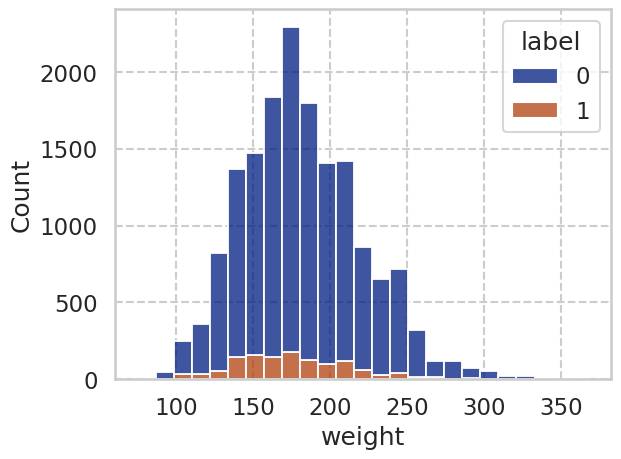

Age


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,63.207850,5.254252,54.0,59.0,63.0,67.0,76.0
1,1249.0,64.240993,5.175638,55.0,60.0,64.0,68.0,76.0


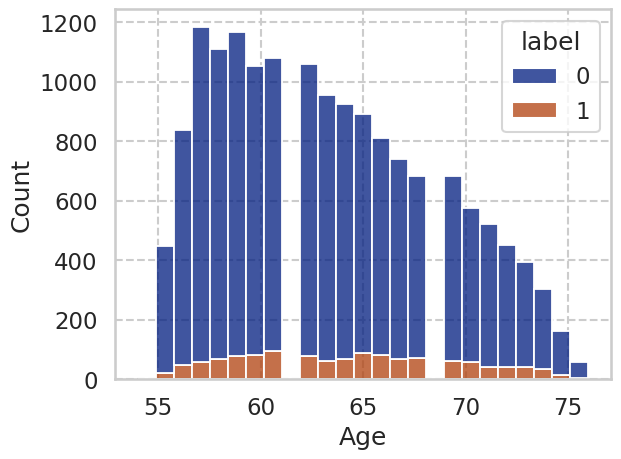

In [18]:
for c in nlst_democols['num']['demo']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"[55, 60)",4743.0,0.056926,0.231726,0.0,0.0,0.0,0.0,1.0
"[60, 65)",5068.0,0.074783,0.263067,0.0,0.0,0.0,0.0,1.0
"[65, 70)",3808.0,0.097426,0.296577,0.0,0.0,0.0,0.0,1.0
"[70, 78)",2457.0,0.093203,0.290776,0.0,0.0,0.0,0.0,1.0


,num,pct,num_mal,pct_mal
"[55, 60)",4743,29.503608,270,5.692600
"[60, 65)",5068,31.525255,379,7.478295
"[65, 70)",3808,23.687484,371,9.742647
"[70, 78)",2457,15.283653,229,9.320309


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",4743,255,1469,3004,15,0.944444,0.328415,0.055556,0.671585,0.147912,0.995031,0.852088,0.004969,0.687118
"[60, 65)",5068,348,1658,3031,31,0.918206,0.353594,0.081794,0.646406,0.173480,0.989876,0.826520,0.010124,0.666732
"[65, 70)",3808,349,1350,2087,22,0.940701,0.392784,0.059299,0.607216,0.205415,0.989569,0.794585,0.010431,0.639706
"[70, 78)",2457,223,850,1378,6,0.973799,0.381508,0.026201,0.618492,0.207829,0.995665,0.792171,0.004335,0.651608


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",4743,256,1861,2612,14,0.948148,0.416052,0.051852,0.583948,0.120926,0.994669,0.879074,0.005331,0.604681
"[60, 65)",5068,366,1936,2753,13,0.965699,0.412881,0.034301,0.587119,0.158992,0.995300,0.841008,0.004700,0.615430
"[65, 70)",3808,347,1542,1895,24,0.935310,0.448647,0.064690,0.551353,0.183695,0.987493,0.816305,0.012507,0.588761
"[70, 78)",2457,222,1004,1224,7,0.969432,0.450628,0.030568,0.549372,0.181077,0.994314,0.818923,0.005686,0.588523


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"[55, 60)",4743,235,1673,2800,35,0.870370,0.374022,0.129630,0.625978,0.123166,0.987654,0.876834,0.012346,0.639890
"[60, 65)",5068,342,1913,2776,37,0.902375,0.407976,0.097625,0.592024,0.151663,0.986847,0.848337,0.013153,0.615233
"[65, 70)",3808,337,1636,1801,34,0.908356,0.475997,0.091644,0.524003,0.170806,0.981471,0.829194,0.018529,0.561450
"[70, 78)",2457,217,1158,1070,12,0.947598,0.519749,0.052402,0.480251,0.157818,0.988909,0.842182,0.011091,0.523810


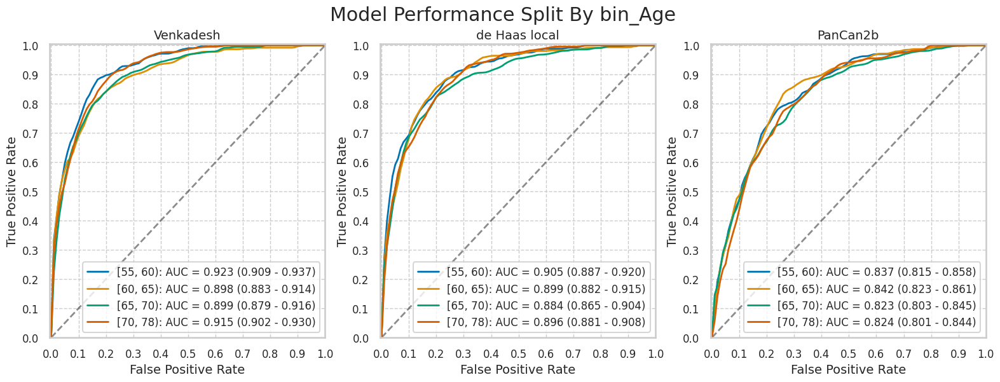

,num,pct,num_mal,pct_mal
"[55, 60)",4743,29.503608,270,5.692600
"[60, 65)",5068,31.525255,379,7.478295
"[65, 70)",3808,23.687484,371,9.742647
"[70, 78)",2457,15.283653,229,9.320309


In [19]:
nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_by_category(nlst_preds, f'bin_Age')

label                                               height  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                
(48, 68]    8587.0  0.079189  0.270050  0.0  0.0  0.0  0.0  1.0  8587.0   
(68, 88]    7467.0  0.075800  0.264696  0.0  0.0  0.0  0.0  1.0  7467.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.916385  2.371898  49.0  63.0  65.0  67.0  68.0  
(68, 88]    71.468997  1.931785  69.0  70.0  71.0  73.0  83.0

,num,pct,num_mal,pct_mal
"(48, 68]",8587,53.488227,680,7.918947
"(68, 88]",7467,46.511773,566,7.580019


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",8587,635,2811,5096,45,0.933824,0.355508,0.066176,0.644492,0.184272,0.991247,0.815728,0.008753,0.667404
"(68, 88]",7467,537,2503,4398,29,0.948763,0.362701,0.051237,0.637299,0.176645,0.993449,0.823355,0.006551,0.660908


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",8587,651,3377,4530,29,0.957353,0.427090,0.042647,0.572910,0.161619,0.993639,0.838381,0.006361,0.603354
"(68, 88]",7467,537,2955,3946,29,0.948763,0.428199,0.051237,0.571801,0.153780,0.992704,0.846220,0.007296,0.600375


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(48, 68]",8587,629,3713,4194,51,0.925000,0.469584,0.075000,0.530416,0.144864,0.987986,0.855136,0.012014,0.561663
"(68, 88]",7467,499,2656,4245,67,0.881625,0.384872,0.118375,0.615128,0.158162,0.984462,0.841838,0.015538,0.635329


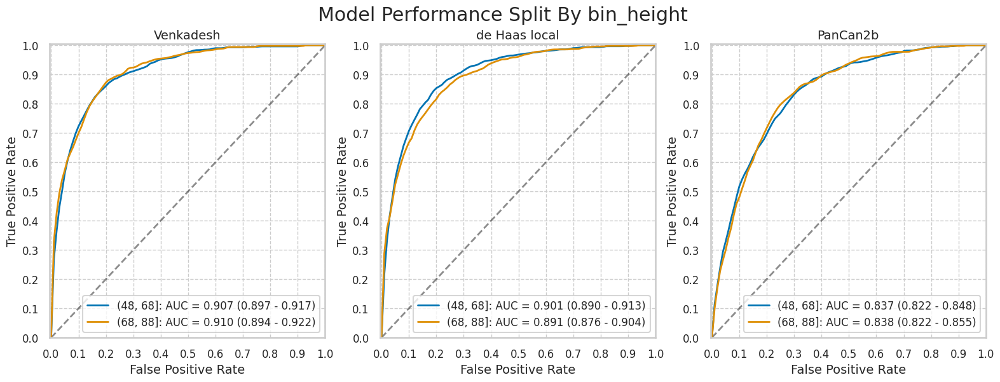

,num,pct,num_mal,pct_mal
"(48, 68]",8587,53.488227,680,7.918947
"(68, 88]",7467,46.511773,566,7.580019


In [20]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_by_category(nlst_preds, f'bin_height')

label                                               weight  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                
(79, 179]   7858.0  0.088063  0.283405  0.0  0.0  0.0  0.0  1.0  7858.0   
(179, 279]  7931.0  0.068592  0.252774  0.0  0.0  0.0  0.0  1.0  7931.0   

                                                                      
                  mean        std    min    25%    50%    75%    max  
bin_weight                                                            
(79, 179]   151.196615  18.964525   88.0  140.0  155.0  166.0  179.0  
(179, 279]  209.704073  23.459800  180.0  190.0  205.0  225.0  279.0

,num,pct,num_mal,pct_mal
"(79, 179]",7858,49.768826,692,8.806312
"(179, 279]",7931,50.231174,544,6.859160


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",7858,657,2712,4454,35,0.949422,0.378454,0.050578,0.621546,0.195013,0.992203,0.804987,0.007797,0.650420
"(179, 279]",7931,506,2520,4867,38,0.930147,0.341140,0.069853,0.658860,0.167217,0.992253,0.832783,0.007747,0.677468


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",7858,669,3148,4018,23,0.966763,0.439297,0.033237,0.560703,0.175269,0.994308,0.824731,0.005692,0.596462
"(179, 279]",7931,509,3061,4326,35,0.935662,0.414377,0.064338,0.585623,0.142577,0.991974,0.857423,0.008026,0.609633


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(79, 179]",7858,632,3336,3830,60,0.913295,0.465532,0.086705,0.534468,0.159274,0.984576,0.840726,0.015424,0.567829
"(179, 279]",7931,486,2918,4469,58,0.893382,0.395018,0.106618,0.604982,0.142773,0.987188,0.857227,0.012812,0.624764


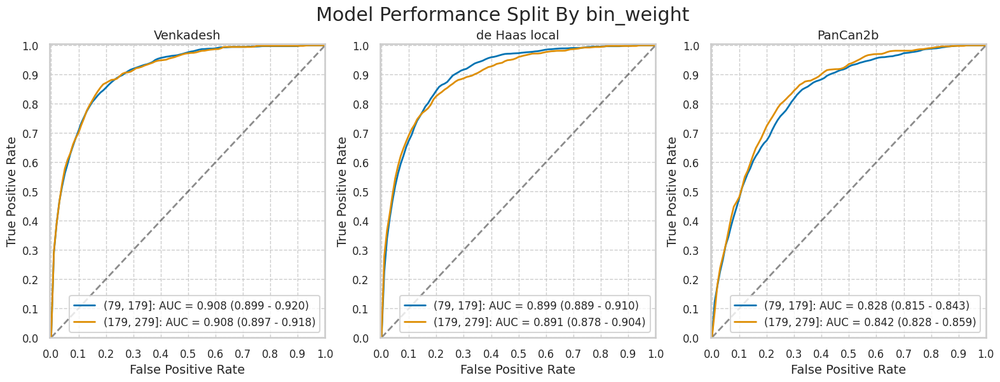

,num,pct,num_mal,pct_mal
"(79, 179]",7858,49.768826,692,8.806312
"(179, 279]",7931,50.231174,544,6.859160


In [21]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_by_category(nlst_preds, f'bin_weight')

### Smoking columns

pkyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,57.575910,23.991348,30.0,40.0,50.0,68.0,260.0
1,1249.0,64.501841,27.541166,30.0,45.0,56.0,78.0,232.0


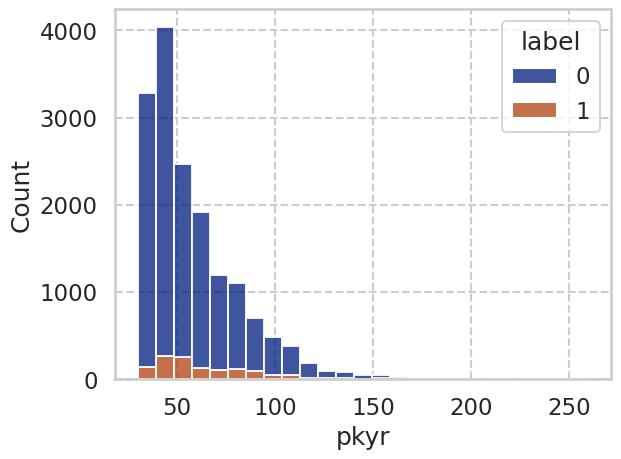

smokeage


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,16.600958,3.496058,4.0,15.0,16.0,18.0,40.0
1,1249.0,16.223379,3.369913,6.0,14.0,16.0,18.0,33.0


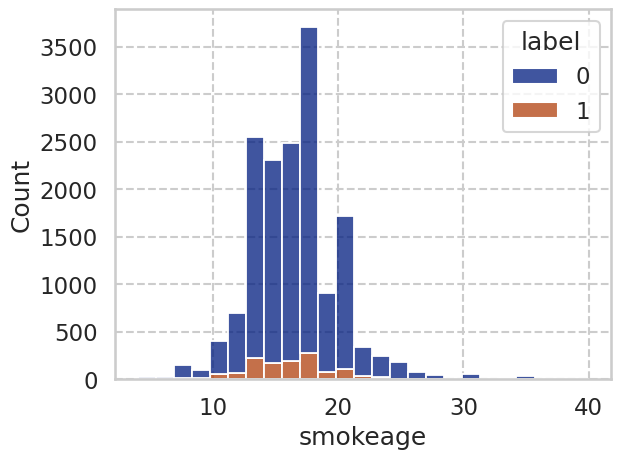

smokeday


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,28.468843,11.351092,12.0,20.0,25.0,30.0,135.0
1,1249.0,29.903122,12.194579,15.0,20.0,30.0,40.0,100.0


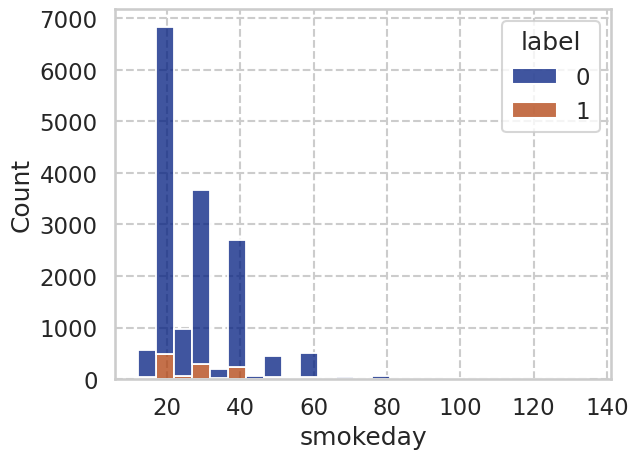

smokeyr


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,40.914621,7.379901,13.0,36.0,41.0,46.0,67.0
1,1249.0,43.640512,7.275904,15.0,39.0,44.0,49.0,65.0


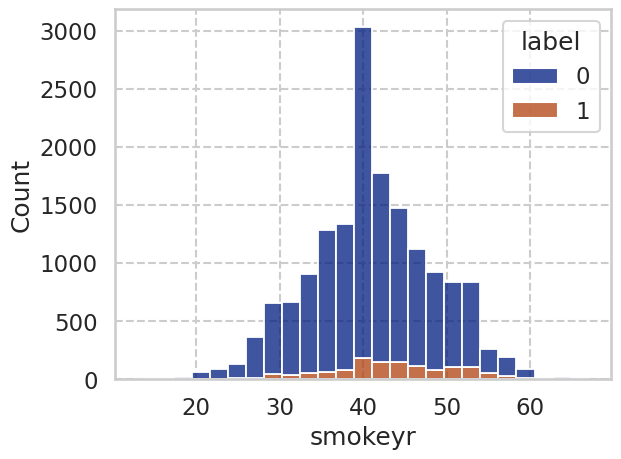

In [22]:
for c in nlst_democols['num']['smoke']:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  8211.0  0.061503  0.240265  0.0  0.0  0.0  0.0  1.0  8211.0   
(51.0, 260.0]   7866.0  0.094584  0.292658  0.0  0.0  0.0  0.0  1.0  7866.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  40.747022   5.740066  30.00  36.0  41.0  45.0   51.0  
(51.0, 260.0]   76.242639  23.119408  51.25  60.0  70.0  86.0  260.0

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",8211,51.072961,505,6.150286
"(51.0, 260.0]",7866,48.927039,744,9.458429


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",8211,468,2731,4975,37,0.926733,0.354399,0.073267,0.645601,0.146296,0.992618,0.853704,0.007382,0.662891
"(51.0, 260.0]",7866,707,2596,4526,37,0.950269,0.364504,0.049731,0.635496,0.214048,0.991891,0.785952,0.008109,0.665268


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",8211,479,3252,4454,26,0.948515,0.422009,0.051485,0.577991,0.128384,0.994196,0.871616,0.005804,0.600779
"(51.0, 260.0]",7866,712,3092,4030,32,0.956989,0.434148,0.043011,0.565852,0.187171,0.992122,0.812829,0.007878,0.602848


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(29.999, 51.0]",8211,457,3259,4447,48,0.904950,0.422917,0.095050,0.577083,0.122982,0.989321,0.877018,0.010679,0.597248
"(51.0, 260.0]",7866,674,3121,4001,70,0.905914,0.438220,0.094086,0.561780,0.177602,0.982805,0.822398,0.017195,0.594330


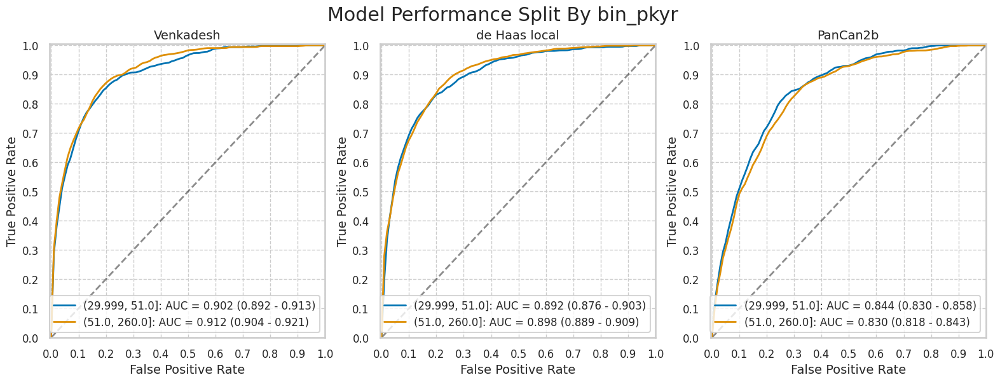

label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(3.999, 16.0]  8738.0  0.082856  0.275681  0.0  0.0  0.0  0.0  1.0   8738.0   
(16.0, 40.0]   7339.0  0.071536  0.257735  0.0  0.0  0.0  0.0  1.0   7339.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(3.999, 16.0]  14.191577  1.929373   4.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.405369  2.727894  17.0  18.0  18.0  20.0  40.0

,num,pct,num_mal,pct_mal
"(3.999, 16.0]",8738,54.350936,724,8.285649
"(16.0, 40.0]",7339,45.649064,525,7.153563


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 16.0]",8738,687,2899,5115,37,0.948895,0.361742,0.051105,0.638258,0.191578,0.992818,0.808422,0.007182,0.663996
"(16.0, 40.0]",7339,488,2428,4386,37,0.929524,0.356325,0.070476,0.643675,0.167353,0.991635,0.832647,0.008365,0.664123


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 16.0]",8738,693,3409,4605,31,0.957182,0.425381,0.042818,0.574619,0.168942,0.993313,0.831058,0.006687,0.606317
"(16.0, 40.0]",7339,498,2935,3879,27,0.948571,0.430731,0.051429,0.569269,0.145063,0.993088,0.854937,0.006912,0.596403


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 16.0]",8738,644,3413,4601,80,0.889503,0.425880,0.110497,0.574120,0.158738,0.982910,0.841262,0.017090,0.600252
"(16.0, 40.0]",7339,487,2967,3847,38,0.927619,0.435427,0.072381,0.564573,0.140996,0.990219,0.859004,0.009781,0.590544


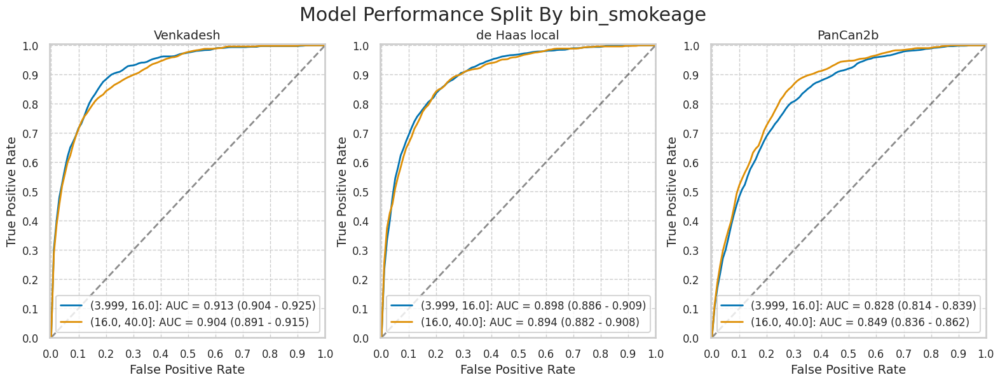

label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  8347.0  0.070325  0.255709  0.0  0.0  0.0  0.0  1.0   8347.0   
(25.0, 135.0]   7730.0  0.085640  0.279850  0.0  0.0  0.0  0.0  1.0   7730.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.138493   2.162074  12.0  20.0  20.0  20.0   25.0  
(25.0, 135.0]   37.695860  10.314049  26.0  30.0  35.0  40.0  135.0

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",8347,51.91889,587,7.032467
"(25.0, 135.0]",7730,48.08111,662,8.564036


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",8347,548,2814,4946,39,0.93356,0.362629,0.06644,0.637371,0.162998,0.992177,0.837002,0.007823,0.658201
"(25.0, 135.0]",7730,627,2513,4555,35,0.94713,0.355546,0.05287,0.644454,0.199682,0.992375,0.800318,0.007625,0.670375


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",8347,560,3308,4452,27,0.954003,0.426289,0.045997,0.573711,0.144778,0.993972,0.855222,0.006028,0.600455
"(25.0, 135.0]",7730,631,3036,4032,31,0.953172,0.429542,0.046828,0.570458,0.172075,0.992370,0.827925,0.007630,0.603234


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(11.999, 25.0]",8347,528,3390,4370,59,0.899489,0.436856,0.100511,0.563144,0.134763,0.986679,0.865237,0.013321,0.586798
"(25.0, 135.0]",7730,603,2990,4078,59,0.910876,0.423033,0.089124,0.576967,0.167826,0.985738,0.832174,0.014262,0.605563


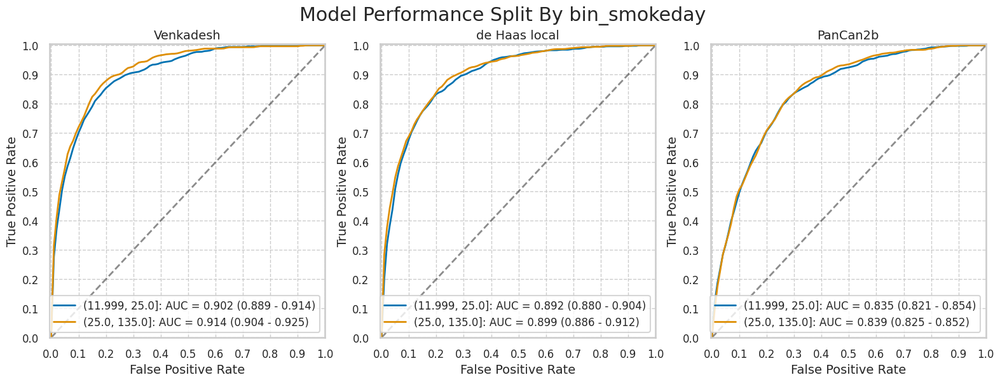

label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(12.999, 41.0]  8536.0  0.054709  0.227426  0.0  0.0  0.0  0.0  1.0  8536.0   
(41.0, 67.0]    7541.0  0.103700  0.304891  0.0  0.0  0.0  0.0  1.0  7541.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(12.999, 41.0]  35.634372  4.652643  13.0  33.0  37.0  40.0  41.0  
(41.0, 67.0]    47.343058  4.437744  42.0  44.0  46.0  50.0  67.0

,num,pct,num_mal,pct_mal
"(12.999, 41.0]",8536,53.094483,467,5.470947
"(41.0, 67.0]",7541,46.905517,782,10.369977


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(12.999, 41.0]",8536,437,2810,5259,30,0.935760,0.348246,0.064240,0.651754,0.134586,0.994328,0.865414,0.005672,0.667291
"(41.0, 67.0]",7541,738,2517,4242,44,0.943734,0.372392,0.056266,0.627608,0.226728,0.989734,0.773272,0.010266,0.660390


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(12.999, 41.0]",8536,441,3396,4673,26,0.944325,0.420870,0.055675,0.579130,0.114934,0.994467,0.885066,0.005533,0.599110
"(41.0, 67.0]",7541,750,2948,3811,32,0.959079,0.436159,0.040921,0.563841,0.202812,0.991673,0.797188,0.008327,0.604827


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(12.999, 41.0]",8536,416,3275,4794,51,0.890792,0.405874,0.109208,0.594126,0.112707,0.989474,0.887293,0.010526,0.610356
"(41.0, 67.0]",7541,715,3105,3654,67,0.914322,0.459387,0.085678,0.540613,0.187173,0.981994,0.812827,0.018006,0.579366


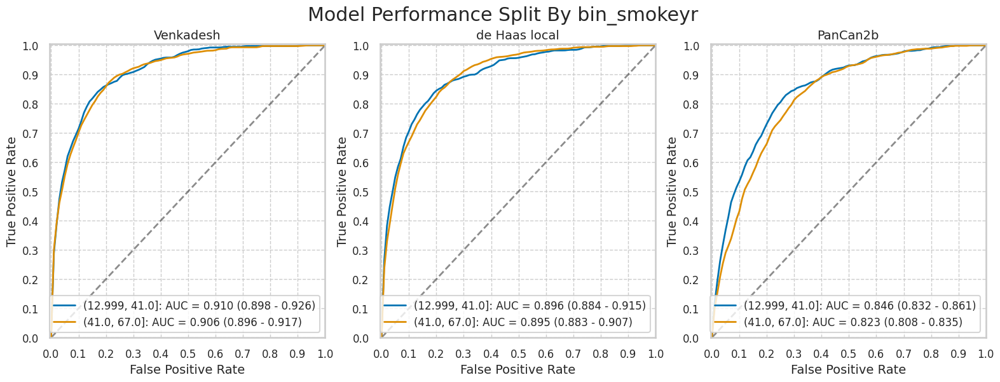

In [23]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

### Included columns from predictions

Diameter [mm]


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,7.484239,4.441719,4.0,4.8,6.0,8.4,69.2
1,1249.0,14.350520,9.007492,4.0,8.6,12.1,17.5,83.0


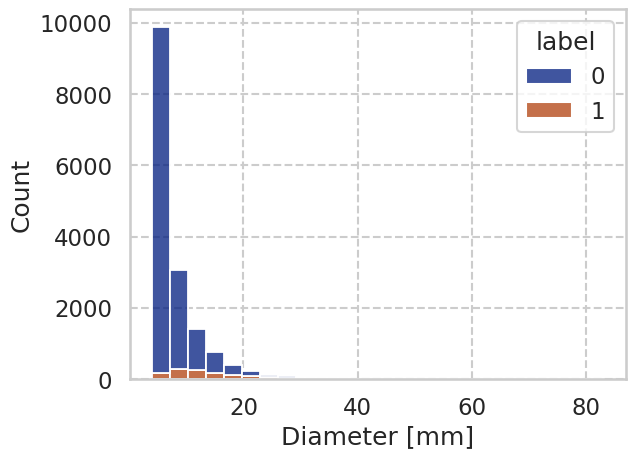

NoduleCounts


,count,mean,std,min,25%,50%,75%,max
label,,,,,,,,
0,14828.0,2.569463,1.665965,1.0,1.0,2.0,3.0,12.0
1,1249.0,2.383507,1.367931,1.0,1.0,2.0,3.0,11.0


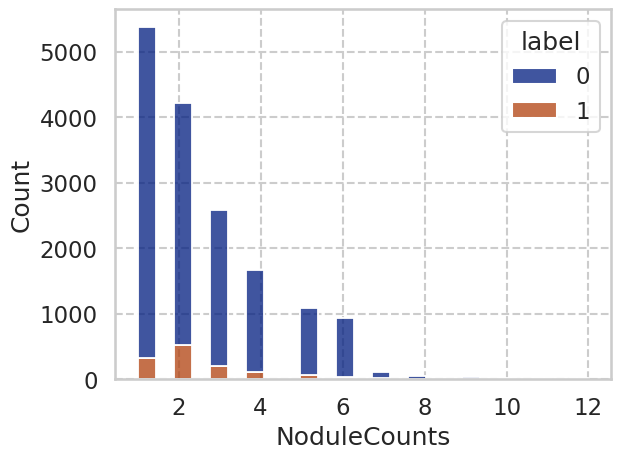

In [24]:
included_num_cols = ["Diameter [mm]", "NoduleCounts"]
for c in included_num_cols:
    print(c)
    display(nlst_preds.groupby('label')[c].describe())
    sns.histplot(nlst_preds, x=c, bins=25, hue="label", multiple='stack')
    plt.show()

label                                               \
                    count      mean       std  min  25%  50%  75%  max   
bin_Diameter [mm]                                                        
(3.999, 6.2]       8206.0  0.015476  0.123446  0.0  0.0  0.0  0.0  1.0   
(6.2, 83.0]        7871.0  0.142549  0.349634  0.0  0.0  0.0  0.0  1.0   

                  Diameter [mm]                                            \
                          count       mean       std  min  25%  50%   75%   
bin_Diameter [mm]                                                           
(3.999, 6.2]             8206.0   4.992603  0.635664  4.0  4.5  4.9   5.5   
(6.2, 83.0]              7871.0  11.171490  6.084835  6.3  7.3  9.2  12.8   

                         
                    max  
bin_Diameter [mm]        
(3.999, 6.2]        6.2  
(6.2, 83.0]        83.0

,num,pct,num_mal,pct_mal
"(3.999, 6.2]",8206,51.041861,127,1.547648
"(6.2, 83.0]",7871,48.958139,1122,14.254860


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.2]",8206,101,1374,6705,26,0.795276,0.170071,0.204724,0.829929,0.068475,0.996137,0.931525,0.003863,0.829393
"(6.2, 83.0]",7871,1074,3953,2796,48,0.957219,0.585716,0.042781,0.414284,0.213646,0.983122,0.786354,0.016878,0.491678


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.2]",8206,105,1986,6093,22,0.826772,0.245823,0.173228,0.754177,0.050215,0.996402,0.949785,0.003598,0.755301
"(6.2, 83.0]",7871,1086,4358,2391,36,0.967914,0.645725,0.032086,0.354275,0.199486,0.985167,0.800514,0.014833,0.441748


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(3.999, 6.2]",8206,27,672,7407,100,0.212598,0.083179,0.787402,0.916821,0.038627,0.986679,0.961373,0.013321,0.905922
"(6.2, 83.0]",7871,1104,5708,1041,18,0.983957,0.845755,0.016043,0.154245,0.162067,0.983003,0.837933,0.016997,0.272519


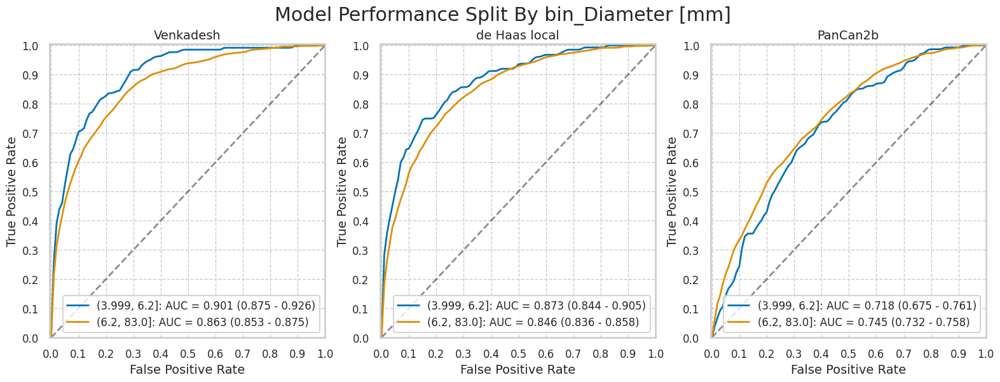

label                                               \
                   count      mean       std  min  25%  50%  75%  max   
bin_NoduleCounts                                                        
(0.999, 2.0]      9587.0  0.087410  0.282450  0.0  0.0  0.0  0.0  1.0   
(2.0, 12.0]       6490.0  0.063328  0.243571  0.0  0.0  0.0  0.0  1.0   

                 NoduleCounts                                                
                        count      mean       std  min  25%  50%  75%   max  
bin_NoduleCounts                                                             
(0.999, 2.0]           9587.0  1.439345  0.496333  1.0  1.0  1.0  2.0   2.0  
(2.0, 12.0]            6490.0  4.203082  1.337277  3.0  3.0  4.0  5.0  12.0

,num,pct,num_mal,pct_mal
"(0.999, 2.0]",9587,59.631772,838,8.741003
"(2.0, 12.0]",6490,40.368228,411,6.332820


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",9587,785,3322,5427,53,0.936754,0.379701,0.063246,0.620299,0.191137,0.990328,0.808863,0.009672,0.647961
"(2.0, 12.0]",6490,390,2005,4074,21,0.948905,0.329824,0.051095,0.670176,0.162839,0.994872,0.837161,0.005128,0.687827


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",9587,792,3978,4771,46,0.945107,0.454681,0.054893,0.545319,0.166038,0.990450,0.833962,0.009550,0.580265
"(2.0, 12.0]",6490,399,2366,3713,12,0.970803,0.389209,0.029197,0.610791,0.144304,0.996779,0.855696,0.003221,0.633590


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
"(0.999, 2.0]",9587,737,4359,4390,101,0.879475,0.498228,0.120525,0.501772,0.144623,0.977511,0.855377,0.022489,0.534787
"(2.0, 12.0]",6490,394,2021,4058,17,0.958637,0.332456,0.041363,0.667544,0.163147,0.995828,0.836853,0.004172,0.685978


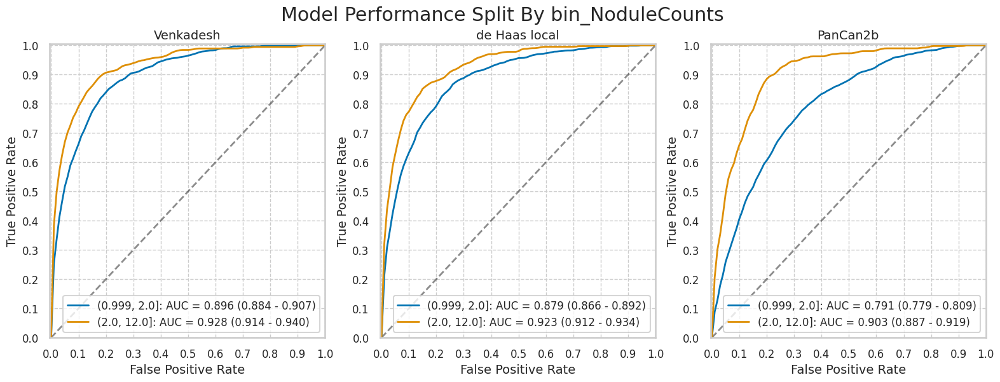

In [25]:
for c in included_num_cols:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2, duplicates='drop')
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_by_category(nlst_preds, f'bin_{c}')

## Further binning categorical columns

In [26]:
nlst_preds[['race', 'ethnic']].value_counts()

race  ethnic
1.0   2.0       14818
2.0   2.0         474
3.0   2.0         222
1.0   1.0         179
6.0   2.0         155
4.0   2.0          64
5.0   2.0          44
6.0   1.0           6
3.0   1.0           4
2.0   1.0           2
4.0   1.0           1
Name: count, dtype: int64

,num,pct,num_mal,pct_mal
False,1259,7.831063,118,9.372518
True,14818,92.168937,1131,7.632609


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1259,113,440,701,5,0.957627,0.385627,0.042373,0.614373,0.204340,0.992918,0.795660,0.007082,0.646545
True,14818,1062,4887,8800,69,0.938992,0.357054,0.061008,0.642946,0.178517,0.992220,0.821483,0.007780,0.665542


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1259,115,520,621,3,0.974576,0.455741,0.025424,0.544259,0.181102,0.995192,0.818898,0.004808,0.584591
True,14818,1076,5824,7863,55,0.951370,0.425513,0.048630,0.574487,0.155942,0.993054,0.844058,0.006946,0.603253


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,1259,106,517,624,12,0.898305,0.453111,0.101695,0.546889,0.170144,0.981132,0.829856,0.018868,0.579825
True,14818,1025,5863,7824,106,0.906278,0.428363,0.093722,0.571637,0.148810,0.986633,0.851190,0.013367,0.597179


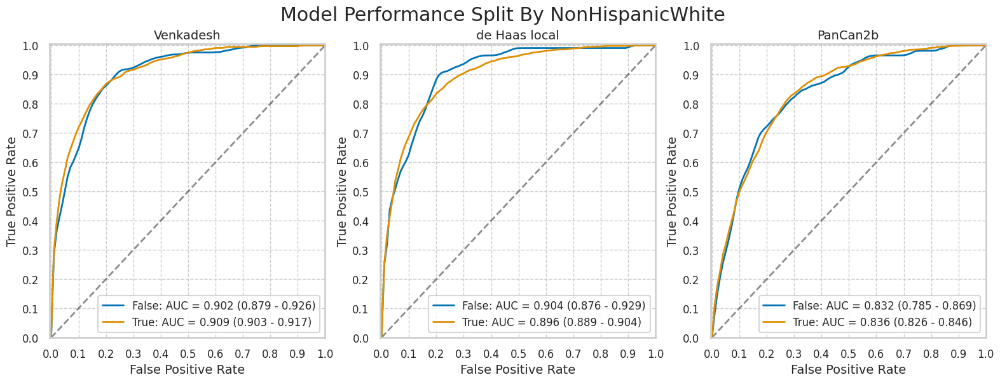

,num,pct,num_mal,pct_mal
False,1259,7.831063,118,9.372518
True,14818,92.168937,1131,7.632609


In [27]:
non_hispanic_white = (nlst_preds['race'] == 1.0) & (nlst_preds['ethnic'] == 2.0)
nlst_preds['NonHispanicWhite'] = non_hispanic_white
plot_by_category(nlst_preds, 'NonHispanicWhite')

,num,pct,num_mal,pct_mal
False,268,1.666978,24,8.955224
True,15809,98.333022,1225,7.748751


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,268,21,113,131,3,0.875000,0.463115,0.125000,0.536885,0.156716,0.977612,0.843284,0.022388,0.567164
True,15809,1154,5214,9370,71,0.942041,0.357515,0.057959,0.642485,0.181219,0.992480,0.818781,0.007520,0.665697


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,268,21,117,127,3,0.875000,0.479508,0.125000,0.520492,0.152174,0.976923,0.847826,0.023077,0.552239
True,15809,1170,6227,8357,55,0.955102,0.426975,0.044898,0.573025,0.158172,0.993462,0.841828,0.006538,0.602631


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,268,24,118,126,0,1.000000,0.483607,0.000000,0.516393,0.169014,1.000000,0.830986,0.000000,0.559701
True,15809,1107,6262,8322,118,0.903673,0.429375,0.096327,0.570625,0.150224,0.986019,0.849776,0.013981,0.596432


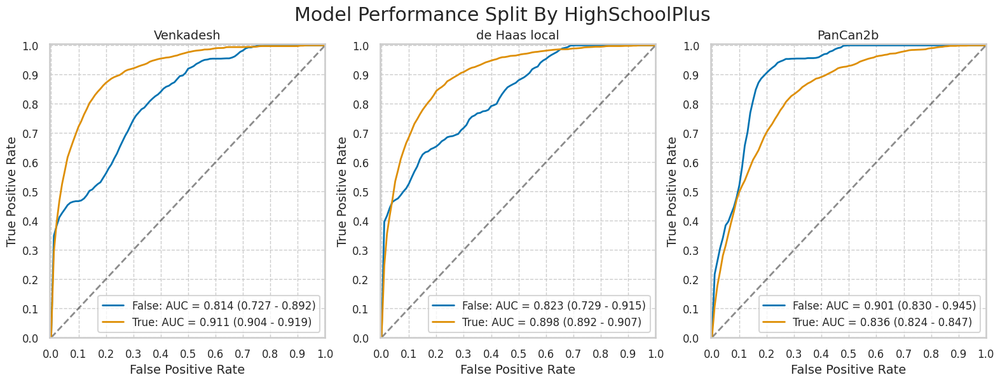

,num,pct,num_mal,pct_mal
False,268,1.666978,24,8.955224
True,15809,98.333022,1225,7.748751


In [28]:
high_school_plus = (nlst_preds['educat'] != 1.0)
nlst_preds['HighSchoolPlus'] = high_school_plus
plot_by_category(nlst_preds, 'HighSchoolPlus')

,num,pct,num_mal,pct_mal
False,10898,67.786279,796,7.304092
True,5179,32.213721,453,8.746862


Venkadesh


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,10898,755,3542,6560,41,0.948492,0.350624,0.051508,0.649376,0.175704,0.993789,0.824296,0.006211,0.671224
True,5179,420,1785,2941,33,0.927152,0.377698,0.072848,0.622302,0.190476,0.988904,0.809524,0.011096,0.648967


de Haas local


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,10898,756,4323,5779,40,0.949749,0.427935,0.050251,0.572065,0.148848,0.993126,0.851152,0.006874,0.599651
True,5179,435,2021,2705,18,0.960265,0.427634,0.039735,0.572366,0.177117,0.993390,0.822883,0.006610,0.606295


PanCan2b


,num,tp,fp,tn,fn,tpr,fpr,fnr,tnr,ppv,npv,fdr,for,acc
False,10898,719,4071,6031,77,0.903266,0.402990,0.096734,0.597010,0.150104,0.987394,0.849896,0.012606,0.619380
True,5179,412,2309,2417,41,0.909492,0.488574,0.090508,0.511426,0.151415,0.983320,0.848585,0.016680,0.546244


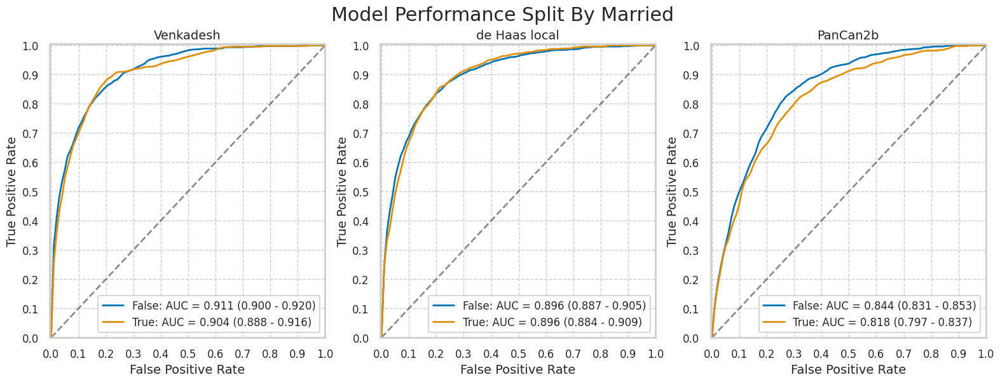

,num,pct,num_mal,pct_mal
False,10898,67.786279,796,7.304092
True,5179,32.213721,453,8.746862


In [29]:
married = (nlst_preds['marital'] != 2.0)
nlst_preds['Married'] = married
plot_by_category(nlst_preds, 'Married')

## Investigate links